In [22]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import itertools

from tslearn.clustering import TimeSeriesKMeans, silhouette_score, KernelKMeans, KShape
from tslearn.metrics import dtw as ts_dtw, cdist_dtw, cdist_soft_dtw, cdist_soft_dtw_normalized, sigma_gak, dtw_path
from tslearn.utils import to_time_series_dataset, to_time_series
from tslearn.datasets import CachedDatasets, UCR_UEA_datasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler
from tslearn.barycenters import dtw_barycenter_averaging
from sklearn.metrics import silhouette_score as sklearn_silhouette, calinski_harabasz_score, davies_bouldin_score, v_measure_score, pairwise_distances
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist, squareform
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from pyts.metrics import dtw as pyts_dtw
from dtaidistance import dtw, preprocessing

### Import Data from UCR Trace Dataset

In [4]:
# X_train, y_train, X_test, y_test = CachedDatasets().load_dataset("Trace")
X_train, y_train, X_test, y_test = UCR_UEA_datasets().load_dataset("Trace")
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")

seed = 0
np.random.seed(seed)
np.random.shuffle(X_train)
np.random.seed(seed)
np.random.shuffle(y_train)
np.random.seed(seed)
np.random.shuffle(X_test)
np.random.seed(seed)
np.random.shuffle(y_test)


# Keep only 50 time series
Scaler = TimeSeriesScalerMeanVariance()
X_train = Scaler.fit_transform(X_train)
X_test = Scaler.transform(X_test)

sz = X_test.shape[1]

# Pre-processing: Differencing
X_train_differenced = preprocessing.differencing(X_train, smooth=0.1)
X_test_differenced = preprocessing.differencing(X_test, smooth=0.1)

#n_clusters
n_classes = 6
total_fig_rows = 12

X_train shape: (100, 275, 1), X_test shape: (100, 275, 1)


In [5]:
def select_optimal_k(results, choice):
    results_list = results[choice]
    if choice == "wcss":
        wss = np.array(results_list) 
        k_range = range(2, n_classes + 1)
        slope = (wss[0] - wss[-1]) / (k_range[0] - k_range[-1])
        intercept = wss[0] - slope * k_range[0]
        y = k_range * slope + intercept
        optimal_k = k_range[(y - wss).argmax()]
    else:
        optimal_k_index = results_list.index(max(results_list))
        optimal_k = optimal_k_index + 2
    
    return optimal_k

# Wrapper for sklearn.metrics functions
def compute_sklearn_metrics(X, labels, scoring, metric=None, labels_true=None, km=None, X_train=None):
    if X.size == 0 or labels.size == 0 or not scoring:
        print('Missing Parameters')
        return
    
    # Transform X for sklearn 
    X_ = to_time_series_dataset(X)
    X_ = X_.reshape((X.shape[0],-1))
    
    if scoring == 'silhouette':
        if metric == 'dtw':
            return silhouette_score(cdist_dtw(X_), labels, metric='precomputed')
        elif metric == 'softdtw':
            # Add gamma parameter if necessary
            return silhouette_score(cdist_soft_dtw_normalized(X_, gamma=0.01), labels, metric='precomputed')
        else:
            return silhouette_score(X_, labels)
    else:
        if scoring == 'calinski_harabasz':
            return calinski_harabasz_score(X_, labels)
        elif scoring == 'calinski_harabasz_dtw':
            return calinski_harabasz_score_dtw(X_, labels, km)
        elif scoring == 'davies_bouldin':
            return davies_bouldin_score(X_, labels)
        elif scoring == 'davies_bouldin_dtw':
            return davies_bouldin_score_dtw(X_, labels, km)
        elif scoring == 'davies_bouldin_medoids':
            return davies_bouldin_score_medoids(X_, labels, km, X_train)
        elif scoring == 'davies_bouldin_medoids_dtw':
            return davies_bouldin_score_medoids(X_, labels, km, X_train, dtw=True)   
        elif scoring == 'v_measure_score':
            return v_measure_score(labels_true, labels)


### Euclidean K-Means


Euclidean k-means

423.375 --> 136.060 --> 92.126 --> 74.654 --> 74.654 --> 
74.858 --> 47.932 --> 47.508 --> 47.508 --> 
58.255 --> 41.478 --> 41.387 --> 41.220 --> 40.882 --> 40.546 --> 40.020 --> 39.679 --> 39.397 --> 39.206 --> 39.097 --> 39.097 --> 
50.970 --> 33.863 --> 33.144 --> 32.642 --> 32.045 --> 31.637 --> 31.111 --> 30.770 --> 30.488 --> 30.297 --> 30.188 --> 30.188 --> 
43.057 --> 27.989 --> 26.757 --> 25.773 --> 25.238 --> 25.166 --> 25.166 --> 


,wcss,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,74.653773,0.864402,178.535660,0.684104,0.669424
k=3,47.508219,0.465237,166.555136,0.906082,0.580603
k=4,39.097050,0.405776,140.418084,0.839623,0.554530
k=5,30.188106,0.236499,141.981317,0.849991,0.490027
k=6,25.166380,0.226479,138.567096,0.911868,0.469222


Finding optimal k based on wcss
Optimal k is found to be 3
Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=3,47.508219,0.403011,172.053165,0.959288,0.569273


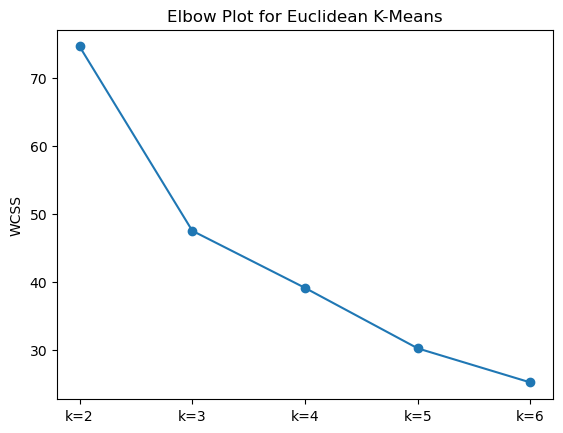

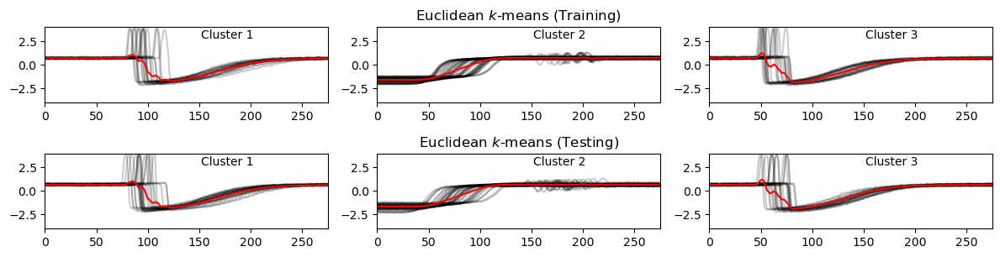

In [6]:
# Euclidean k-means
print("\nEuclidean k-means\n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'calinski_harabasz', 'davies_bouldin', 'v_measure_score']
choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    km = TimeSeriesKMeans(n_clusters=i, verbose=True, random_state=seed)
    y_pred_train = km.fit_predict(X_train)
    # Store model and predictions
    models.append(km)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(km.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, index, labels_true=y_train))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

# Plot Elbow method
plt.title("Elbow Plot for Euclidean K-Means")
plt.ylabel("WCSS")
plt.plot(df_indexes, results['wcss'], marker = 'o')

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

def select_optimal_k(results, choice):
    results_list = results[choice]
    if choice == "wcss":
        wss = np.array(results_list) 
        k_range = range(2, n_classes + 1)
        slope = (wss[0] - wss[-1]) / (k_range[0] - k_range[-1])
        intercept = wss[0] - slope * k_range[0]
        y = k_range * slope + intercept
        optimal_k = k_range[(y - wss).argmax()]
    else:
        optimal_k_index = results_list.index(max(results_list))
        optimal_k = optimal_k_index + 2
    
    return optimal_k

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
km = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]
y_pred_test = km.predict(X_test)

#Metrics
print("Testing Results")

test_results = {vi: [] for vi in validation_indexes}

for index in validation_indexes:
    if index == 'wcss':
        test_results[index].append(km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, labels_true=y_test))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)

#Plotting
subplot_index = 1

plt.figure(figsize=(12,18))
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Euclidean $k$-means (Training)")
subplot_index += optimal_k
        
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Euclidean $k$-means (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()



### Dynamic Time Warping

#### Helper Functions

In [7]:
# Modified Metric functions from sci-kit learn library to use DTW distance matrix instead of Euclidean distance
# Reference: https://github.com/scikit-learn/scikit-learn/blob/f07e0138b/sklearn/metrics/cluster/_unsupervised.py#L319

def davies_bouldin_score_dtw(X, labels, km):
    n_labels = len(np.unique(labels))
    n_samples, _ = X.shape
    
    intra_dists = np.zeros(n_labels)
    centroids = np.zeros((n_labels, len(X[0])), dtype=float)
    for k in range(n_labels):
        cluster_k = X[labels == k]
        # Use DBA cluster centroid
        centroid = np.transpose(km.cluster_centers_[k])
        centroids[k] = centroid
        # Use DTW distance to calculate distances from cluster objects to centroid
        intra_dists[k] = np.average(cdist_dtw(cluster_k, centroid))
#         intra_dists[k] = np.average(pairwise_distances(cluster_k, centroid))

    # Use DTW distance to calculate distance between centroids
    centroid_distances = cdist_dtw(centroids)
#     centroid_distances = pairwise_distances(centroids)

    if np.allclose(intra_dists, 0) or np.allclose(centroid_distances, 0):
        return 0.0

    centroid_distances[centroid_distances == 0] = np.inf
    combined_intra_dists = intra_dists[:, None] + intra_dists
    scores = np.max(combined_intra_dists / centroid_distances, axis=1)
    return np.mean(scores)

def davies_bouldin_score_medoids(X, labels, km, X_train=None, dtw=None):
    n_labels = len(np.unique(labels))
    n_samples, _ = X.shape
    
    intra_dists = np.zeros(n_labels)
    centroids = np.zeros((n_labels, len(X[0])), dtype=float)
    for k in range(n_labels):
        cluster_k = X[labels == k]
        # Use DBA cluster centroid
        if X_train is None:
            centroid = np.transpose(X[km.medoid_indices_[k]])
        else:
            centroid = np.transpose(X_train[km.medoid_indices_[k]])

        centroids[k] = centroid
        # Use DTW distance to calculate distances from cluster objects to centroid
        if dtw:
            intra_dists[k] = np.average(cdist_dtw(cluster_k, centroid))
        else:
            if X_train is None:
                intra_dists[k] = np.average(pairwise_distances(cluster_k, [centroid]))
            else:
                intra_dists[k] = np.average(pairwise_distances(cluster_k, centroid))
 
    # Use DTW distance to calculate distance between centroids
    if dtw:
        centroid_distances = cdist_dtw(centroids)
    else:
        centroid_distances = pairwise_distances(centroids)

    if np.allclose(intra_dists, 0) or np.allclose(centroid_distances, 0):
        return 0.0

    centroid_distances[centroid_distances == 0] = np.inf
    combined_intra_dists = intra_dists[:, None] + intra_dists
    scores = np.max(combined_intra_dists / centroid_distances, axis=1)
    return np.mean(scores)

def plot_helper(barycenter, X):
    # plot all points of the data set
    for series in X:
        plt.plot(series.ravel(), "k-", alpha=.2)
    # plot the given barycenter of them
    plt.plot(barycenter.ravel(), "r-", linewidth=2)
    plt.tight_layout()
    plt.show()

def calinski_harabasz_score_dtw(X, labels, km):
    
    n_labels = len(np.unique(labels))
    n_samples, _ = X.shape
    
    extra_disp, intra_disp = 0.0, 0.0
    # Global DBA Average
    dba_global_mean = np.transpose(dtw_barycenter_averaging(X, max_iter=10, n_init=2))
#     plot_helper(dtw_barycenter_averaging(X, max_iter=10, n_init=2), X)

    print(dba_global_mean.shape)
#     mean = np.mean(X, axis=0)
    for k in range(n_labels):
        cluster_k = X[labels == k]
        # Find the cluster DBA average
        dba_cluster_k_mean = np.transpose(km.cluster_centers_[k])
        print(dba_cluster_k_mean.shape)
        # Use DTW distance instead of squared Euclidean distance
        extra_disp += len(cluster_k) * (ts_dtw(dba_cluster_k_mean, dba_global_mean) ** 2)
        intra_disp += ts_dtw(cluster_k, dba_cluster_k_mean) ** 2

    return (
        1.0
        if intra_disp == 0.0
        else extra_disp * (n_samples - n_labels) / (intra_disp * (n_labels - 1.0))
    )

### DBA K-Means 


DBA k-means

Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


11.706 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.492 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.492 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.492 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


12.496 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.556 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


2.551 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


(1, 275)
(1, 275)
(1, 275)
Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


3.482 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.758 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.757 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.757 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


7.362 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.794 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.794 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.794 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


0.794 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.729 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


0.503 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


0.495 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


0.488 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


0.486 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


0.481 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


0.481 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


1.133 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


0.486 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


0.486 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.088 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.430 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.427 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.427 --> 
Init 2


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.905 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.470 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.461 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.460 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


0.460 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
Init 1


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

1.207 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


0.385 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.382 --> 

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.382 --> 
Init 2


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


0.794 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


0.410 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


0.408 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.407 --> 

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0.407 --> 


[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


,wcss,silhouette,calinski_harabasz,calinski_harabasz_dtw,davies_bouldin,davies_bouldin_dtw,v_measure_score
k=2,2.491995,0.864402,178.535660,184.554660,0.684104,0.168231,0.669424
k=3,0.757228,0.869811,91.979459,95.778528,3.747732,0.184078,0.849415
k=4,0.481241,0.693333,73.564812,73.855874,2.966215,0.480592,0.744241
k=5,0.426587,0.632168,57.338996,59.986580,2.488282,0.606995,0.688496
k=6,0.381520,0.577804,47.007282,51.966047,2.172433,0.546054,0.678774


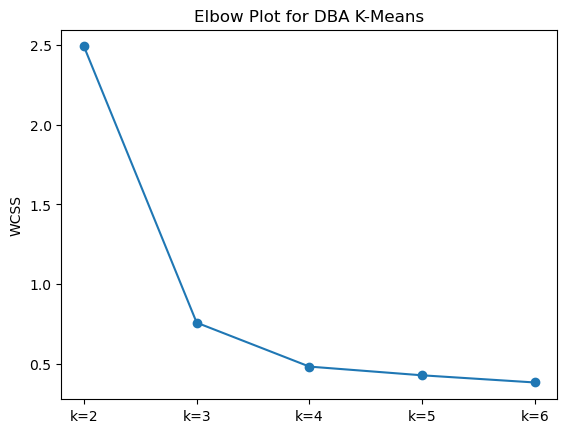

Finding optimal k based on wcss
Optimal k is found to be 3
Testing Results


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)


,wcss,silhouette,calinski_harabasz_dtw,davies_bouldin_dtw,v_measure_score
k=3,0.757228,0.881894,107.476185,0.174726,0.869493


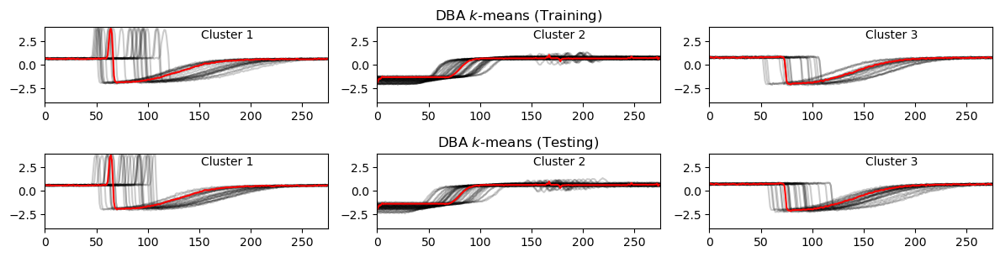

In [8]:
# DBA-k-means
print("\nDBA k-means\n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'calinski_harabasz', 'calinski_harabasz_dtw', 'davies_bouldin', 'davies_bouldin_dtw', 'v_measure_score']
choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    dba_km = TimeSeriesKMeans(n_clusters=i,
                              n_init=2,
                              metric="dtw",
#                               metric_params={"global_constraint": "sakoe_chiba"},
                              verbose=True,
                              dtw_inertia=True,
                              max_iter_barycenter=10,
                              random_state=seed)
    y_pred_train = dba_km.fit_predict(X_train)
    # Store model and predictions
    models.append(dba_km)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(dba_km.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, metric='dtw', labels_true=y_train, km=dba_km))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

# Plot Elbow method
plt.figure(1)
plt.title("Elbow Plot for DBA K-Means")
plt.ylabel("WCSS")
plt.plot(df_indexes, results['wcss'], marker = 'o')
plt.show()

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
dba_km = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]
y_pred_test = dba_km.predict(X_test)

#Metrics
print("Testing Results")
test_validation_index = ['wcss', 'silhouette', 'calinski_harabasz_dtw', 'davies_bouldin_dtw', 'v_measure_score']
test_results = {vi: [] for vi in test_validation_index}

for index in test_validation_index:
    if index == 'wcss':
        test_results[index].append(dba_km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, metric='dtw', labels_true=y_test, km=dba_km))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)

#Plotting
subplot_index = 1
plt.figure(figsize=(12, 18))

for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("DBA $k$-means (Training)")
subplot_index += optimal_k
        
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("DBA $k$-means (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()

### Euclidean K-Medoids


Euclidean $K$-Medoids



,wcss,silhouette,davies_bouldin,davies_bouldin_medoids,v_measure_score
k=2,865.361251,0.864402,0.684104,0.647267,0.669424
k=3,688.917090,0.465237,0.906082,0.955028,0.580603
k=4,570.528043,0.292122,0.884037,0.904987,0.511254
k=5,492.054452,0.236016,0.848969,0.818567,0.492323
k=6,457.692583,0.222347,0.958461,0.924424,0.470452


Finding optimal k based on wcss
Optimal k is found to be 4
Testing Results


,wcss,silhouette,davies_bouldin_medoids,v_measure_score
k=4,570.528043,0.212243,0.9498,0.510865


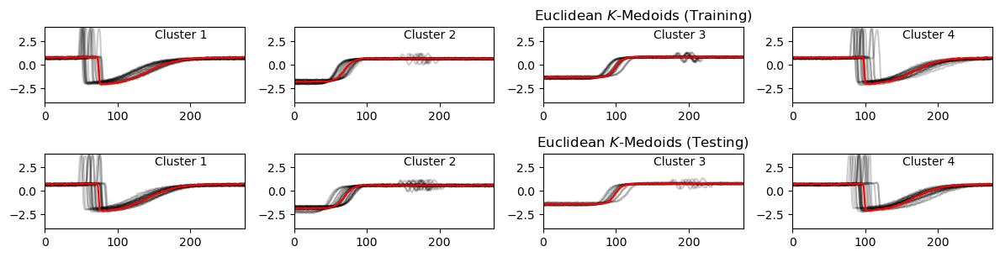

In [9]:
# Euclidean K-Medoids
print("\nEuclidean $K$-Medoids\n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'davies_bouldin', 'davies_bouldin_medoids', 'v_measure_score']

choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    kmed_km = KMedoids(n_clusters=i, init='k-medoids++', metric='euclidean', method='pam', random_state=seed)
    y_pred_train = kmed_km.fit_predict(to_time_series_dataset(X_train).reshape((X_train.shape[0],-1)))
    # Store model and predictions
    models.append(kmed_km)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(kmed_km.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, labels_true=y_train, km=kmed_km))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
kmed_km = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]
y_pred_test = kmed_km.predict(to_time_series_dataset(X_test).reshape((X_test.shape[0],-1)))

print("Testing Results")
test_validation_index = ['wcss', 'silhouette', 'davies_bouldin_medoids', 'v_measure_score']
test_results = {vi: [] for vi in test_validation_index}

for index in test_validation_index:
    if index == 'wcss':
        test_results[index].append(kmed_km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, labels_true=y_test, km=kmed_km, X_train=X_train))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)

#Plotting
subplot_index = 1

plt.figure(figsize=(12,18))
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(kmed_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Euclidean $K$-Medoids (Training)")
subplot_index += optimal_k
        
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(kmed_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Euclidean $K$-Medoids (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()
  

### DTW K-Medoids


DTW $K$-Medoids 



,wcss,silhouette,davies_bouldin,davies_bouldin_medoids_dtw,v_measure_score
k=2,223.246376,0.864402,0.684104,0.238269,0.669424
k=3,122.420985,0.869811,3.747732,0.182524,0.849415
k=4,85.478548,0.693333,2.966215,0.408403,0.744241
k=5,74.896830,0.628324,2.517682,0.596270,0.702046
k=6,66.118959,0.629397,2.650607,0.669232,0.766072


Finding optimal k based on wcss
Optimal k is found to be 3
Testing Results


,wcss,silhouette,davies_bouldin_medoids_dtw,v_measure_score
k=3,122.420985,0.881894,0.173217,0.869493


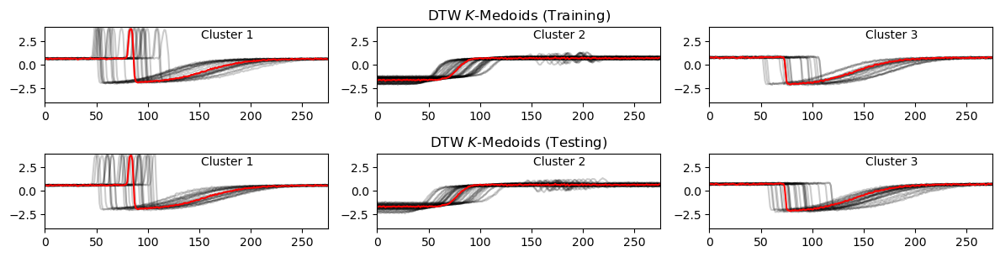

In [24]:
# DTW K-Medoids
print("\nDTW $K$-Medoids \n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'davies_bouldin', 'davies_bouldin_medoids_dtw', 'v_measure_score']

choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    kmed_km = KMedoids(n_clusters=i, init='k-medoids++', metric='precomputed', method='pam', random_state=seed)
    X_ = to_time_series_dataset(X_train).reshape((X_train.shape[0],-1))

    y_pred_train = kmed_km.fit_predict(cdist_dtw(X_))
    # Store model and predictions
    models.append(kmed_km)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(kmed_km.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, metric='dtw', labels_true=y_train, km=kmed_km))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
kmed_km = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]

# # Fit on test set
# medoids = X_test[kmed_km.medoid_indices_]

# Create distance matrix between test and train dataset
indexed_mat = []
for ts in to_time_series_dataset(X_test).reshape((X_test.shape[0],-1)):
    new_row = []
    for med in to_time_series_dataset(X_train).reshape((X_train.shape[0],-1)):
        path, dist = dtw_path(ts, med)
        new_row.append(dist)
    indexed_mat.append(new_row)
indexed_mat = np.array(indexed_mat)

y_pred_test = kmed_km.predict(indexed_mat)

#Metrics
print("Testing Results")
test_validation_index = ['wcss', 'silhouette', 'davies_bouldin_medoids_dtw', 'v_measure_score']
test_results = {vi: [] for vi in test_validation_index}

for index in test_validation_index:
    if index == 'wcss':
        test_results[index].append(kmed_km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, metric='dtw', labels_true=y_test, km=kmed_km, X_train=X_train))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)


#Plotting
subplot_index = 1

plt.figure(figsize=(12,18))
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
#     plt.plot(kmed_km.cluster_centers_[yi].ravel(), "r-")
    plt.plot(X_train[kmed_km.medoid_indices_[yi]].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("DTW $K$-Medoids (Training)")
subplot_index += optimal_k

for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
#     plt.plot(kmed_km.cluster_centers_[yi].ravel(), "r-")
    plt.plot(X_train[kmed_km.medoid_indices_[yi]].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("DTW $K$-Medoids (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()

### Soft-DTW K-Means (Gamma = 0.01)


Soft-DTW k-means



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


11.706 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.692 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


2.691 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


3.517 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.1s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.1s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.850 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


0.849 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.2s finished


2.779 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.648 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.608 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.600 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.609 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.2s finished


0.595 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.587 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.586 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.586 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.585 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.2s finished


0.585 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.585 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.2s finished


0.585 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


0.585 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.3s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


2.105 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.550 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.550 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.551 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.4s finished


0.552 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.3s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


2.063 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.534 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.535 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.536 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.5s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


0.537 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.4s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


,wcss,silhouette,calinski_harabasz_dtw,davies_bouldin_dtw,v_measure_score
k=2,2.690633,0.968567,186.971627,0.172907,0.669424
k=3,0.849206,0.971568,88.448593,0.207187,0.849415
k=4,0.584966,0.835471,62.438560,0.445285,0.741739
k=5,0.551808,0.781567,54.096685,0.569622,0.689646
k=6,0.537214,0.680679,46.133337,0.946257,0.659865


Finding optimal k based on wcss
Optimal k is found to be 3
Testing Results
(1, 275)
(1, 275)
(1, 275)
(1, 275)


,wcss,silhouette,calinski_harabasz_dtw,davies_bouldin_dtw,v_measure_score
k=3,0.849206,0.97622,95.827507,0.19185,0.869493


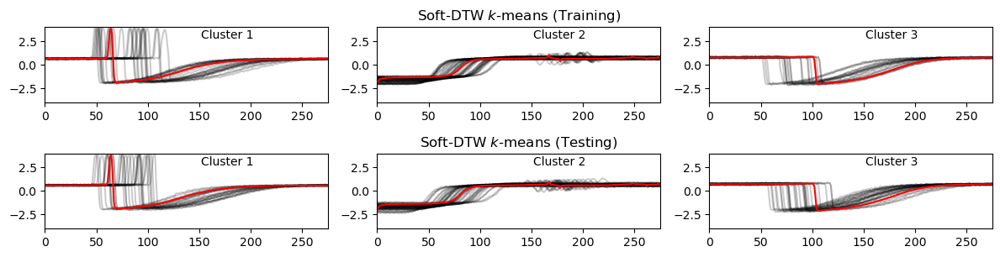

In [25]:
# Soft-DTW-k-means
print("\nSoft-DTW k-means\n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'calinski_harabasz_dtw', 'davies_bouldin_dtw', 'v_measure_score']
choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    sdtw_km = TimeSeriesKMeans(n_clusters=i,
#                                tol = 0.05,
                               metric="softdtw",
                               metric_params={"gamma": 0.01},
                               verbose=True,
                               dtw_inertia=True,
                               random_state=seed)
    y_pred_train = sdtw_km.fit_predict(X_train)
    # Store model and predictions
    models.append(sdtw_km)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(sdtw_km.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, metric='softdtw', labels_true=y_train, km=sdtw_km))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
sdtw_km = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]
y_pred_test = sdtw_km.predict(X_test)

#Metrics
print("Testing Results")
test_validation_index = ['wcss', 'silhouette', 'calinski_harabasz_dtw', 'davies_bouldin_dtw', 'v_measure_score']
test_results = {vi: [] for vi in test_validation_index}

for index in test_validation_index:
    if index == 'wcss':
        test_results[index].append(sdtw_km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, metric='softdtw', labels_true=y_test, km=sdtw_km))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)

#Plotting
subplot_index = 1
plt.figure(figsize=(12, 18))

for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Soft-DTW $k$-means (Training)")
subplot_index += optimal_k
        
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Soft-DTW $k$-means (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()

### Soft-DTW K-Means (Gamma = 1)


Soft-DTW k-means



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


219.503 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


49.828 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.585 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.442 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.613 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.530 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.604 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.541 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.601 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.545 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.597 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.550 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.592 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.554 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.588 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.559 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.584 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.564 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.581 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.568 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.578 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.573 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.576 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.576 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.573 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.580 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.0s finished


4.572 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.582 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.570 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.581 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.568 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.578 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.566 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.575 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.565 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.572 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.563 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.569 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.562 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.566 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.561 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.564 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.560 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.562 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.559 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.560 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.558 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.558 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.558 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


4.557 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.1s finished


(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


213.854 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


16.929 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


4.621 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


4.473 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.2s finished


4.453 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.1s finished


4.466 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.423 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.436 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.1s finished


4.383 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.1s finished


4.403 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.351 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.377 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.332 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.354 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.319 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.352 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.328 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.365 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.344 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.378 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.357 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.387 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.367 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.392 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.373 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.395 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.378 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.396 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.382 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.398 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.386 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.399 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.387 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.400 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.386 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.398 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.386 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.396 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.385 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.394 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.384 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.392 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.384 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.391 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.383 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.389 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.383 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.388 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.383 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


4.388 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.0s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


5.630 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.782 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.748 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.802 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.777 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.819 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.790 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.831 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.807 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.847 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.828 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.867 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.851 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.888 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.876 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.910 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.897 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.927 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.916 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.942 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.931 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.954 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.944 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.963 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.953 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.969 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.959 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.973 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.964 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.976 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.968 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.978 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.971 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.980 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.973 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.980 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.974 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.981 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.976 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.982 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.977 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.982 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.978 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.982 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


2.979 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.983 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.980 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.983 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.981 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.1s finished


2.984 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    0.0s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


4.800 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.780 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.733 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.806 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.784 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.840 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.820 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.875 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.862 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.915 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.906 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.957 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.947 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.991 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.980 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.013 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


2.997 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.024 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.010 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.032 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.017 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.038 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.024 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.041 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.028 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.031 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.032 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.034 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.035 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.035 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.042 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.036 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.042 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.036 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.042 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.037 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.042 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.038 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.042 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.039 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.042 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.039 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.040 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


3.043 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    0.1s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


4.727 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.730 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.422 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.289 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.280 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.262 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.300 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.327 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.331 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.338 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.344 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.370 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.405 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.419 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.430 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.439 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.446 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.450 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.454 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.456 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.459 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.460 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.463 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.463 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.464 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.463 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.464 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.463 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.464 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.463 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.463 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.462 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.462 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.461 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.461 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.460 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.460 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.459 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.460 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.459 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.460 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.459 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.459 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.458 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.459 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.458 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.458 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.457 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.1s finished


1.458 --> 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


1.457 --> 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    0.2s finished


(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


,wcss,silhouette,calinski_harabasz_dtw,davies_bouldin_dtw,v_measure_score
k=2,4.557292,0.968567,167.655517,0.236288,0.669424
k=3,4.387602,0.613372,158.961443,2.104989,0.623037
k=4,2.983522,0.789623,88.940244,2.831045,0.801305
k=5,3.042824,0.597779,87.151278,4.207465,0.748274
k=6,1.456856,0.463292,83.050007,3.698183,0.663955


Finding optimal k based on wcss
Optimal k is found to be 4
Testing Results
(1, 275)
(1, 275)
(1, 275)
(1, 275)
(1, 275)


,wcss,silhouette,calinski_harabasz_dtw,davies_bouldin_dtw,v_measure_score
k=4,2.983522,0.714216,102.846424,2.903398,0.803532


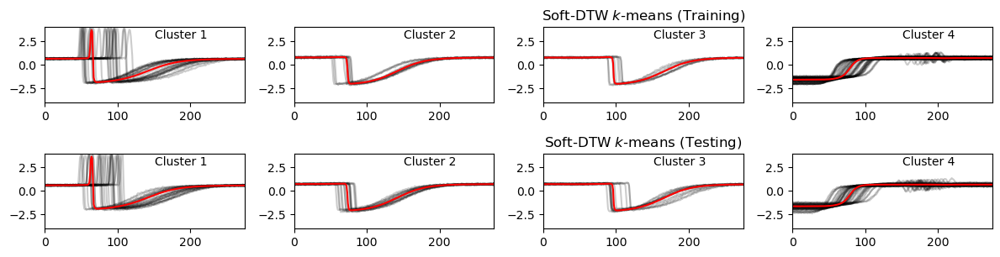

In [26]:
# Soft-DTW-k-means
print("\nSoft-DTW k-means\n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'calinski_harabasz_dtw', 'davies_bouldin_dtw', 'v_measure_score']
choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    sdtw_km = TimeSeriesKMeans(n_clusters=i,
#                                tol = 0.05,
                               metric="softdtw",
#                                metric_params={"gamma": 0.01},
                               verbose=True,
                               dtw_inertia=True,
                               random_state=seed)
    y_pred_train = sdtw_km.fit_predict(X_train)
    # Store model and predictions
    models.append(sdtw_km)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(sdtw_km.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, metric='softdtw', labels_true=y_train, km=sdtw_km))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
sdtw_km = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]
y_pred_test = sdtw_km.predict(X_test)

#Metrics
print("Testing Results")
test_validation_index = ['wcss', 'silhouette', 'calinski_harabasz_dtw', 'davies_bouldin_dtw', 'v_measure_score']
test_results = {vi: [] for vi in test_validation_index}

for index in test_validation_index:
    if index == 'wcss':
        test_results[index].append(sdtw_km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, metric='softdtw', labels_true=y_test, km=sdtw_km))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)

#Plotting
subplot_index = 1
plt.figure(figsize=(12, 18))

for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Soft-DTW $k$-means (Training)")
subplot_index += optimal_k
        
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("Soft-DTW $k$-means (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()

### K-Shape


KShape

0.004 --> 0.003 --> 0.003 --> 0.003 --> 0.003 --> 0.003 --> 
0.001 --> 0.001 --> 0.001 --> 
0.001 --> 0.001 --> 0.001 --> 0.001 --> 
Resumed because of empty cluster
0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 
Resumed because of empty cluster
0.002 --> 0.002 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 0.001 --> 


,wcss,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.003098,0.864402,178.535660,0.684104,0.669424
k=3,0.001466,0.682626,106.902131,0.664654,0.574619
k=4,0.001313,0.608566,74.084031,0.664772,0.526978
k=5,0.001068,0.563126,55.231114,0.685633,0.514672
k=6,0.001064,0.520607,43.880819,0.742813,0.500747


Finding optimal k based on wcss
Optimal k is found to be 3
Testing Results


,wcss,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=3,2.983522,0.65464,114.998046,0.767113,0.58521


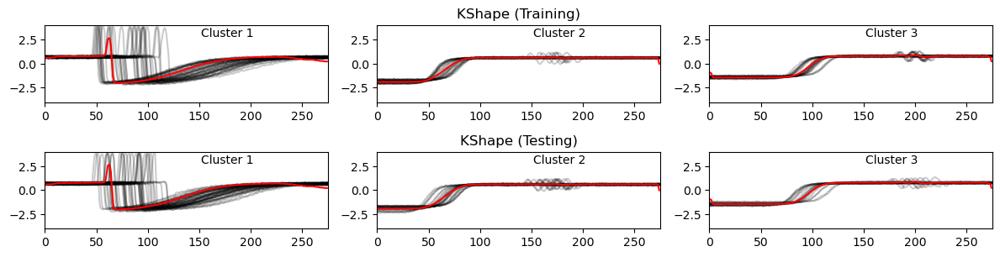

In [27]:
# KShape
print("\nKShape\n")

#Metrics
validation_indexes = ['wcss', 'silhouette', 'calinski_harabasz', 'davies_bouldin', 'v_measure_score']
choice = 'wcss'
results = {vi: [] for vi in validation_indexes}

# Finding optimal k clusters
df_indexes = []
predictions = []
models = []

for i in range(2, n_classes + 1):
    df_indexes.append(f"k={i}")
    ks = KShape(n_clusters=i, n_init=1, verbose=True, random_state=seed)
    y_pred_train = ks.fit_predict(X_train)
    # Store model and predictions
    models.append(ks)
    predictions.append(y_pred_train)

    for index in validation_indexes:
        if index == 'wcss':
            results[index].append(ks.inertia_)
        else:
            results[index].append(compute_sklearn_metrics(X_train, y_pred_train, scoring=index, labels_true=y_train, km=ks))

results_df = pd.DataFrame(results, index = df_indexes)
display(results_df)

#Evaluate value of k based on choice
print(f"Finding optimal k based on {choice}")

optimal_k = select_optimal_k(results, choice)
print(f"Optimal k is found to be {optimal_k}")

# Retrieve optimal model
ks = models[optimal_k - 2]
y_pred_train = predictions[optimal_k - 2]
y_pred_test = ks.predict(X_test)

#Metrics
print("Testing Results")
test_validation_index = ['wcss', 'silhouette', 'calinski_harabasz', 'davies_bouldin', 'v_measure_score']
test_results = {vi: [] for vi in test_validation_index}

for index in test_validation_index:
    if index == 'wcss':
        test_results[index].append(sdtw_km.inertia_)
    else:
        test_results[index].append(compute_sklearn_metrics(X_test, y_pred_test, scoring=index, labels_true=y_test, km=ks))

test_results_df = pd.DataFrame(test_results, index=[f"k={optimal_k}"])
display(test_results_df)

#Plotting
subplot_index = 1
plt.figure(figsize=(12, 18))

for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_train[y_pred_train == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(ks.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("KShape (Training)")
subplot_index += optimal_k
        
for yi in range(optimal_k):
    plt.subplot(total_fig_rows, optimal_k, subplot_index + yi)
    for xx in X_test[y_pred_test == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(ks.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == optimal_k//2:
        plt.title("KShape (Testing)")
subplot_index += optimal_k

plt.tight_layout()
plt.show()

### Hierarchical Clustering

In [31]:
# X_train, y_train, X_test, y_test = CachedDatasets().load_dataset("Trace")
X_train, y_train, X_test, y_test = UCR_UEA_datasets().load_dataset("Trace")
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")

seed = 0
np.random.seed(seed)
np.random.shuffle(X_train)
np.random.seed(seed)
np.random.shuffle(y_train)
np.random.seed(seed)
np.random.shuffle(X_test)
np.random.seed(seed)
np.random.shuffle(y_test)

# Keep only 50 time series
Scaler = TimeSeriesScalerMeanVariance()
X_train = Scaler.fit_transform(X_train)
X_test = Scaler.transform(X_test)

sz = X_test.shape[1]

def create_dist_matrix(dataset, dist_func, **kwargs):
    distance_mat = np.zeros((len(dataset), len(dataset)))
    for i, j in itertools.product(range(len(dataset)),
                                  range(len(dataset))):
        distance_mat[i, j] = dist_func(dataset[i], dataset[j], **kwargs)
    return distance_mat

# Transform X for sklearn 
def format_dataset(X, metric):
    X_ = to_time_series_dataset(X)
    X_ = X_.reshape((X.shape[0],-1))
    if metric == 'euclidean':
        dist_mat = squareform(cdist(X_, X_, metric=metric))
    elif metric == 'dtw':
#         dist_mat = create_dist_matrix(X_, ts_dtw, global_constraint = 'sakoe_chiba', sakoe_chiba_radius=0.1)
#         ts_dtw(X_, X_, global_constraint = 'sakoe_chiba', sakoe_chiba_radius=0.1)
        dist_mat = cdist_dtw(X_)
    elif metric == 'softdtw':
        dist_mat = cdist_soft_dtw_normalized(X_, X_, gamma = 0.01)
    elif metric == "fastdtw":
#         dist_mat = squareform(create_dist_matrix(X_, pyts_dtw, method='sakoechiba', options={'window_size': 0.3}))
        dist_mat = create_dist_matrix(X_, pyts_dtw, method='multiscale')
    elif metric == "cdtw":
        dist_mat = dtw.distance_matrix_fast(X_)

    print(f"Distance Matrix Shape: {dist_mat.shape}")
    return dist_mat

X_train shape: (100, 275, 1), X_test shape: (100, 275, 1)


In [44]:
def print_clusters(timeSeries, model, k, plot=False):
    # k Number of clusters I'd like to extract
    print(f"Printing clusters for model k={k}")
    results = fcluster(model, k, criterion='maxclust')

    # check the results
    s = pd.Series(results)
    clusters = s.unique()
    
    score = round(v_measure_score(labels_true=y_test, labels_pred=s), 2)
    print(f"V-Measure Score: {score}")
    
    #Metrics
    print("Testing Results")
    test_validation_index = ['silhouette', 'calinski_harabasz','davies_bouldin', 'v_measure_score']
    test_results = {vi: [] for vi in test_validation_index}

    for index in test_validation_index:
        test_results[index].append(compute_sklearn_metrics(X_test, s, scoring=index, metric='dtw', labels_true=y_test))

    test_results_df = pd.DataFrame(test_results, index=[f"k={k}"])
    display(test_results_df)

    plt.figure(figsize=(10, 5))
    for c in clusters:
        cluster_indices = s[s==c].index
        print("Cluster %d number of entries %d/%d" % (c, len(cluster_indices), len(s.index)))
        if plot:
            for idx in cluster_indices:
                plt.plot(timeSeries[idx], linewidth=1, color='grey', alpha=0.5)
            plt.show()
            
def determine_optimal_clusters(model, threshold):
    distances = model[:,2]
    differences = np.diff(distances)
    differences = differences[::-1]
    
    cutoff = 0
    for idx, diff in enumerate(differences):
        if idx == 0:
            continue
        if diff < differences[idx-1] * threshold:
            cutoff = idx
            break
            
    return cutoff + 1

##### Original Dataset (Single Linkage)

Distance Matrix Shape: (100, 100)


C:\Users\rhysl\AppData\Local\Temp\ipykernel_33472\1613589844.py:3: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  model = linkage(X, method='single')


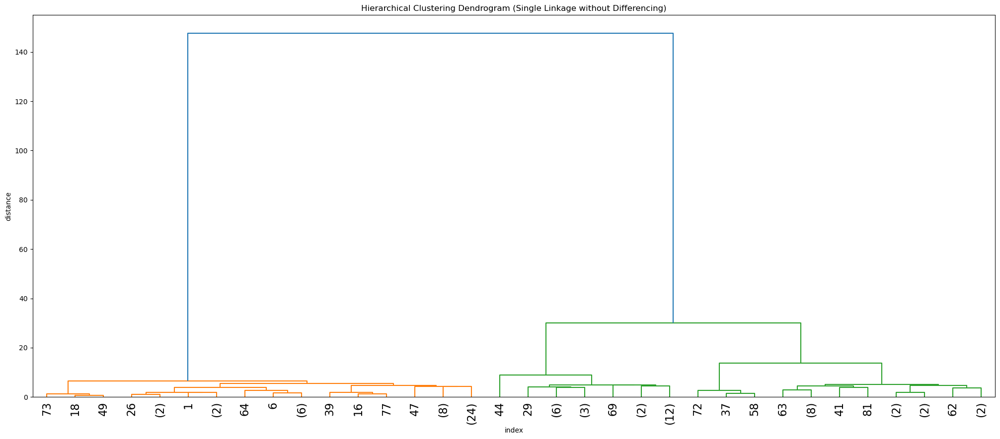

In [61]:
X = format_dataset(X_train, "dtw")

model = linkage(X, method='single')
# Plot dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram (Single Linkage without Differencing)')
plt.xlabel('index')
plt.ylabel('distance')
dendrogram(
    model,
    p=5,
    truncate_mode='level',
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=16.,  # font size for the x axis labels
    show_leaf_counts = True
)
plt.show()

#### Optimal number of clusters

In [62]:
print(f"Determined Optimal Number of Clusters: {determine_optimal_clusters(model, 0.2)}")

# print_clusters(X_test, model, determine_optimal_clusters(model, 0.2), plot=True)

Determined Optimal Number of Clusters: 2


#### Iterating through 2 - 6 clusters

Printing clusters for model k=2
V-Measure Score: 0.02
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.001497,1.247858,8.79216,0.016934


Cluster 1 number of entries 53/100


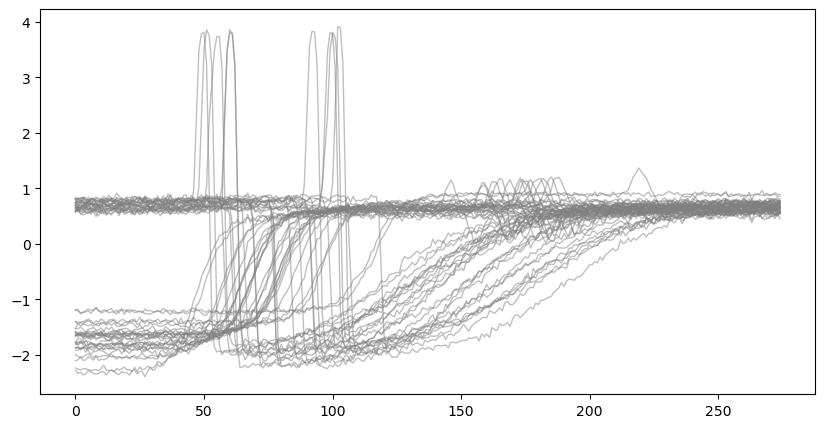

Cluster 2 number of entries 47/100


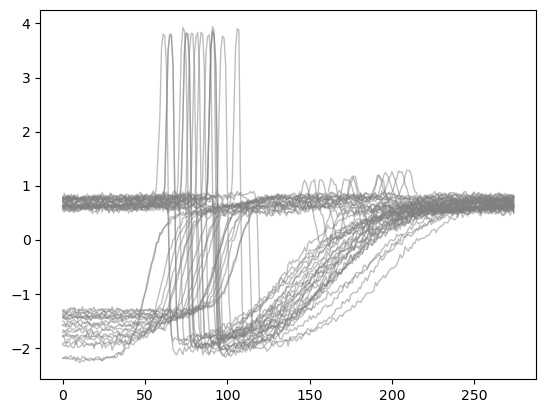

Printing clusters for model k=3
V-Measure Score: 0.05
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=3,-0.057924,0.788225,11.584201,0.04959


Cluster 1 number of entries 53/100


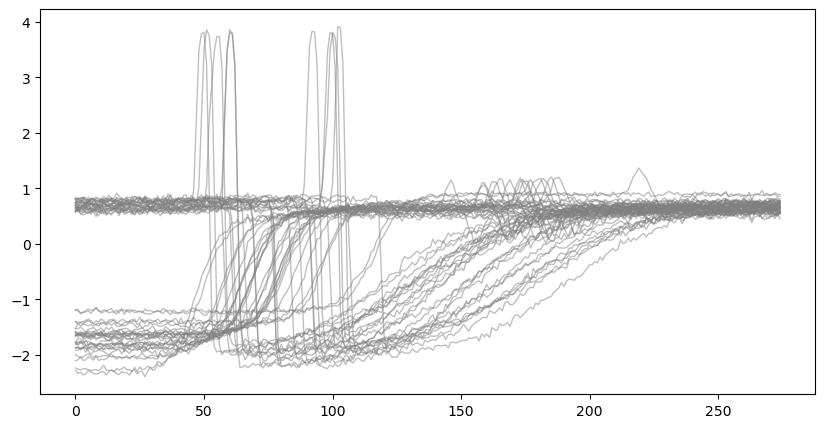

Cluster 3 number of entries 21/100


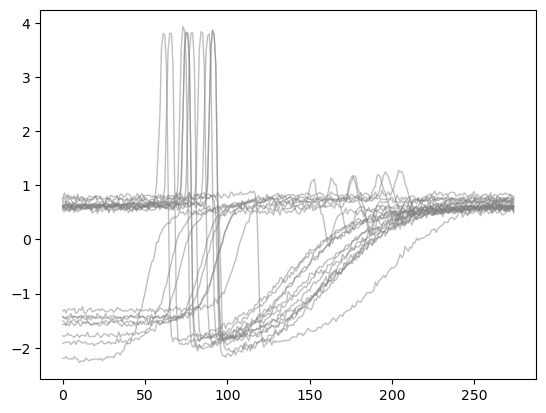

Cluster 2 number of entries 26/100


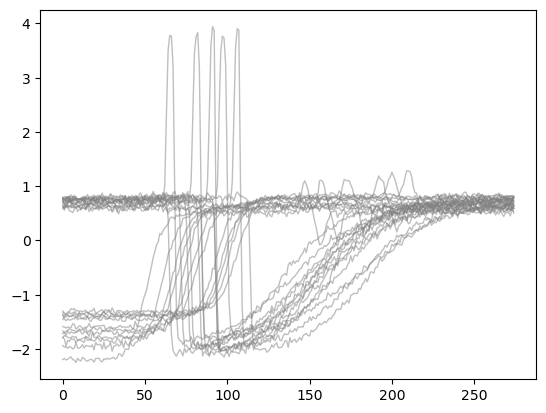

Printing clusters for model k=4
V-Measure Score: 0.06
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=4,-0.213515,0.860708,9.129038,0.057352


Cluster 1 number of entries 53/100


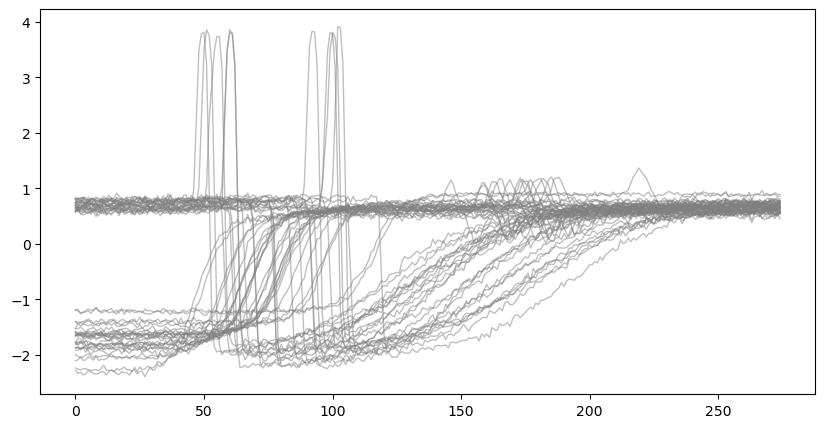

Cluster 4 number of entries 18/100


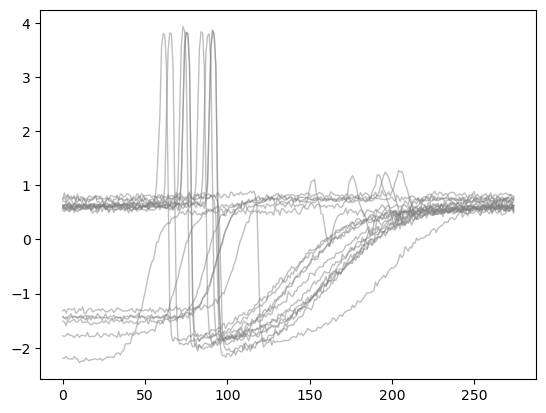

Cluster 2 number of entries 26/100


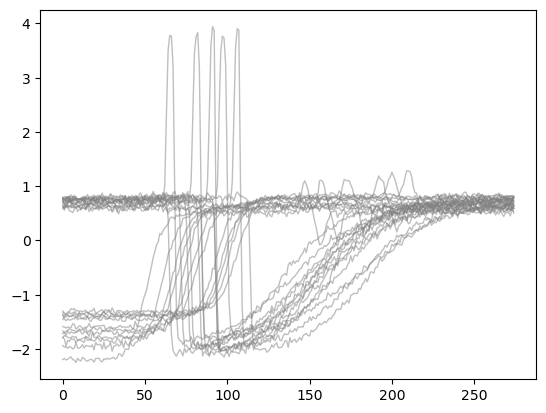

Cluster 3 number of entries 3/100


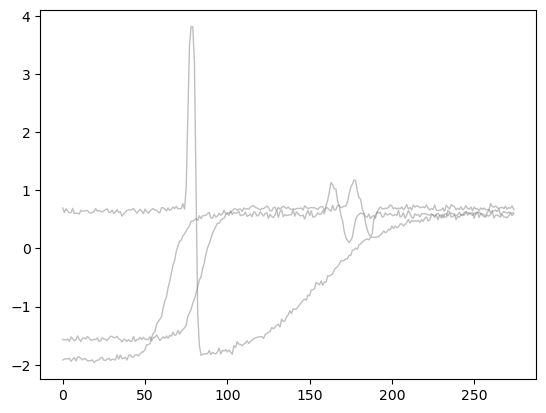

Printing clusters for model k=5
V-Measure Score: 0.07
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=5,-0.501101,0.907068,8.362991,0.070188


Cluster 1 number of entries 53/100


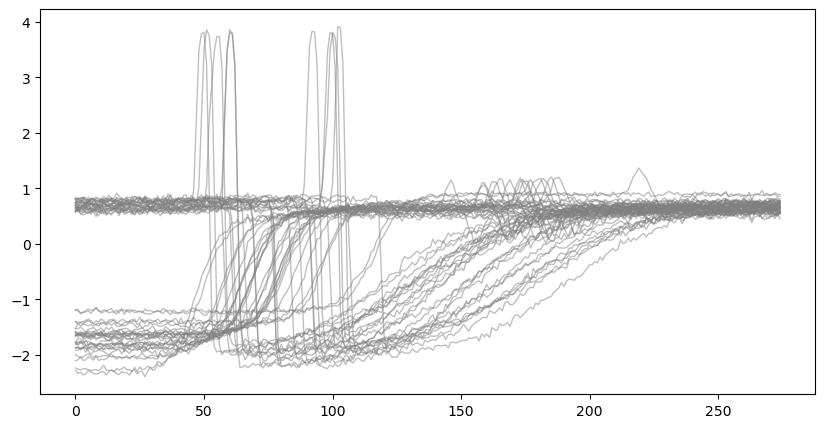

Cluster 5 number of entries 18/100


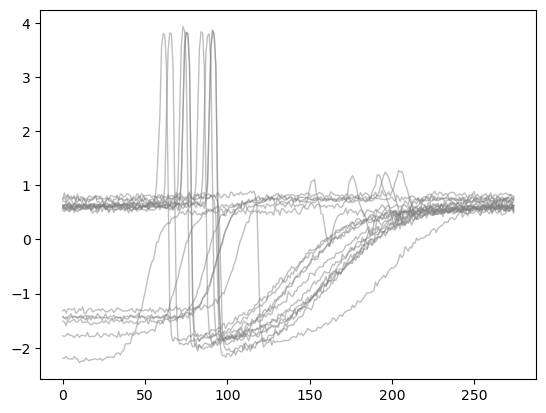

Cluster 2 number of entries 25/100


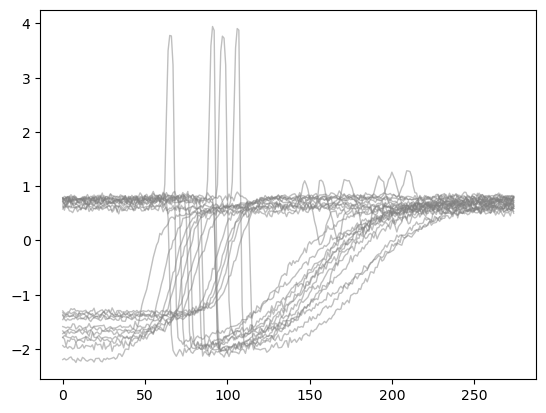

Cluster 4 number of entries 3/100


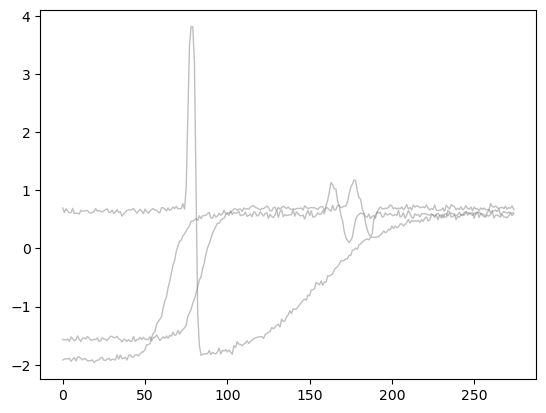

Cluster 3 number of entries 1/100


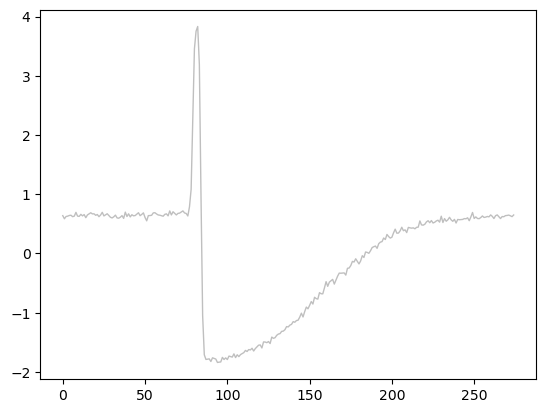

Printing clusters for model k=6
V-Measure Score: 0.08
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=6,-0.502097,0.902272,7.349225,0.080009


Cluster 2 number of entries 50/100


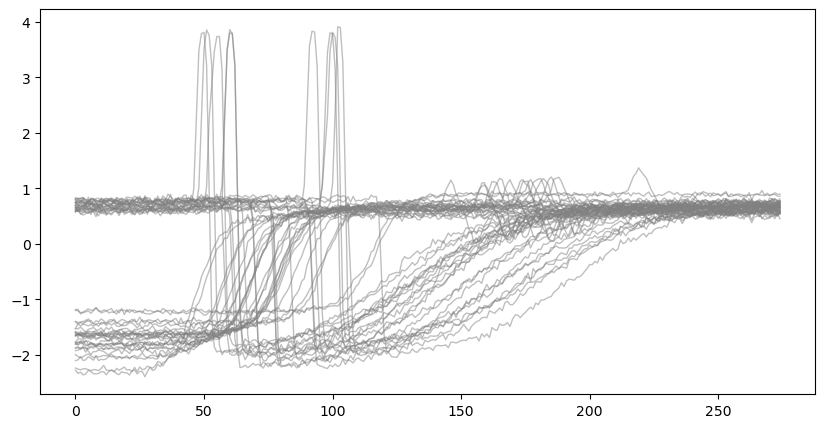

Cluster 6 number of entries 18/100


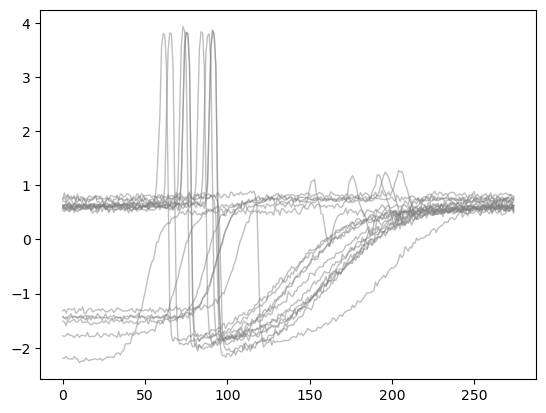

Cluster 3 number of entries 25/100


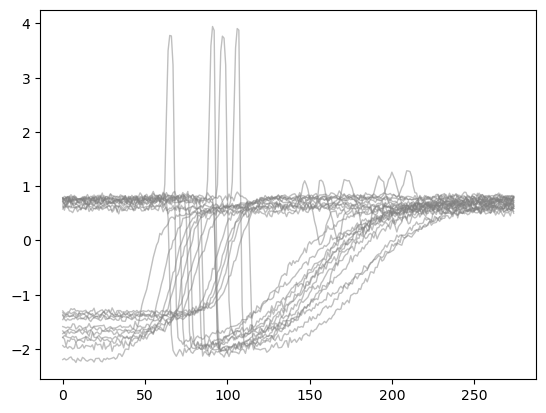

Cluster 1 number of entries 3/100


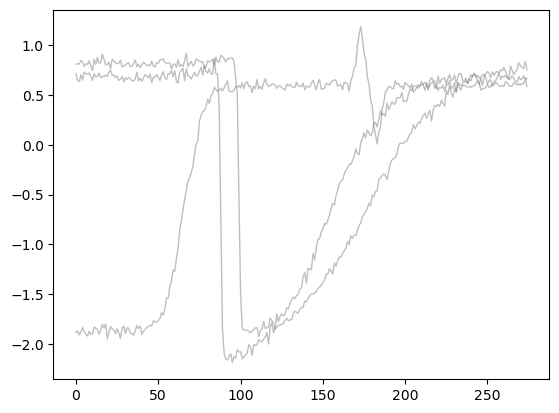

Cluster 5 number of entries 3/100


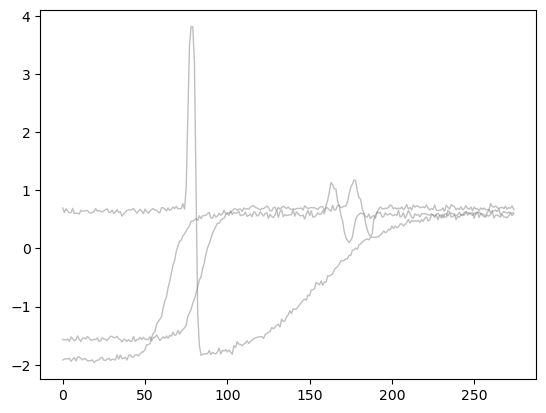

Cluster 4 number of entries 1/100


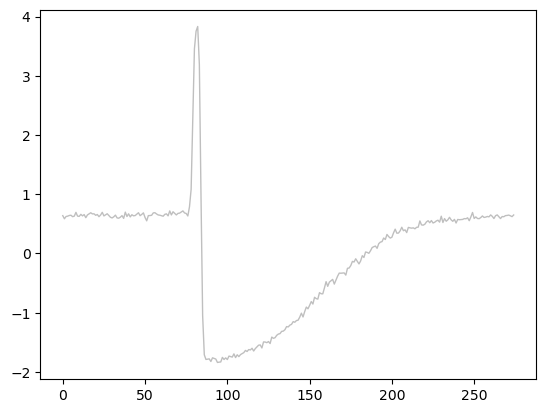

In [63]:


print_clusters(X_test, model, 2, plot=True)
print_clusters(X_test, model, 3, plot=True)
print_clusters(X_test, model, 4, plot=True)
print_clusters(X_test, model, 5, plot=True)
print_clusters(X_test, model, 6, plot=True)

#### Differenced Dataset (Single Linkage)

In [47]:
def print_clusters_with_differenced(timeSeries, timeSeries_differenced, model, k, plot=False):
    # k Number of clusters I'd like to extract
    print(f"Printing clusters for model k={k}")
    results = fcluster(model, k, criterion='maxclust')

    # check the results
    s = pd.Series(results)
    clusters = s.unique()

    score = round(v_measure_score(labels_true=y_test, labels_pred=s), 2)
    print(f"V-Measure Score: {score}")
    
    #Metrics
    print("Testing Results")
    test_validation_index = ['silhouette', 'calinski_harabasz','davies_bouldin', 'v_measure_score']
    test_results = {vi: [] for vi in test_validation_index}

    for index in test_validation_index:
        test_results[index].append(compute_sklearn_metrics(X_test, s, scoring=index, metric='dtw', labels_true=y_test))

    test_results_df = pd.DataFrame(test_results, index=[f"k={k}"])
    display(test_results_df)

    for c in clusters:
        cluster_indices = s[s==c].index
        print("Cluster %d number of entries %d" % (c, len(cluster_indices)))
        if plot:
            plt.figure(figsize=(10, 5))
            for idx in cluster_indices:
                plt.subplot(1, 2, 1)
                plt.plot(timeSeries[idx], linewidth=1, color='skyblue', alpha=0.5)
                plt.subplot(1, 2, 2)
                plt.plot(timeSeries_differenced[idx], linewidth=1, color='lightcoral', alpha=0.5)
            
            plt.show()

Distance Matrix Shape: (100, 100)


C:\Users\rhysl\AppData\Local\Temp\ipykernel_33472\2857580127.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  model = linkage(X, method='single')


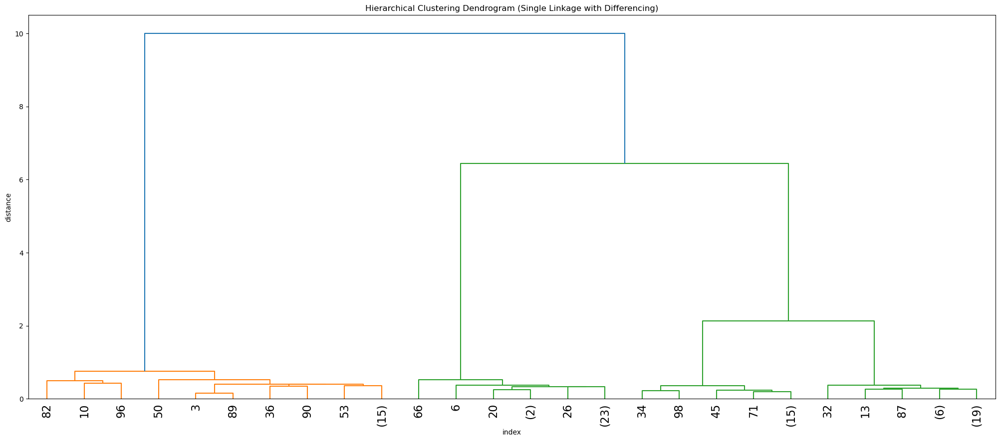

In [58]:
# Pre-processing: Differencing
X_differenced = preprocessing.differencing(X_test, smooth=0.1)
X = format_dataset(X_differenced, "dtw")

model = linkage(X, method='single')
# Plot dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram (Single Linkage with Differencing)')
plt.xlabel('index')
plt.ylabel('distance')
dendrogram(
    model,
    p=5,
    truncate_mode='level',
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=16.,  # font size for the x axis labels
    show_leaf_counts = True
)
plt.show()

#### Optimal number of clusters

Determined Optimal Number of Clusters: 4
Printing clusters for model k=4
V-Measure Score: 1.0
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=4,0.557864,67.829742,6.983799,1.0


Cluster 4 number of entries 28


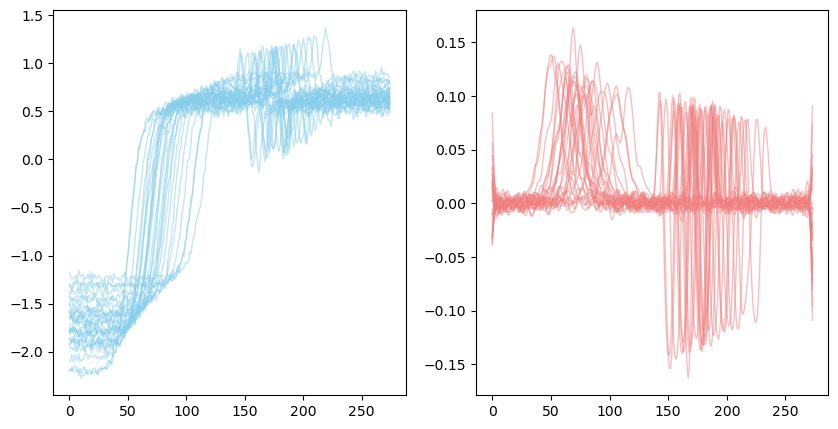

Cluster 3 number of entries 19


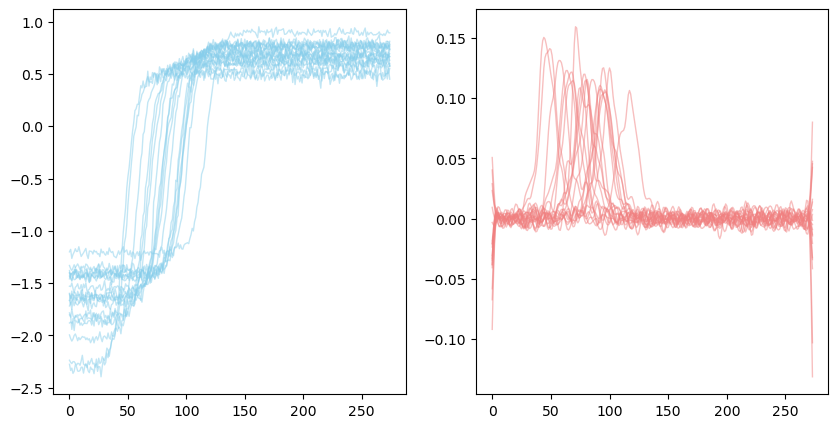

Cluster 1 number of entries 24


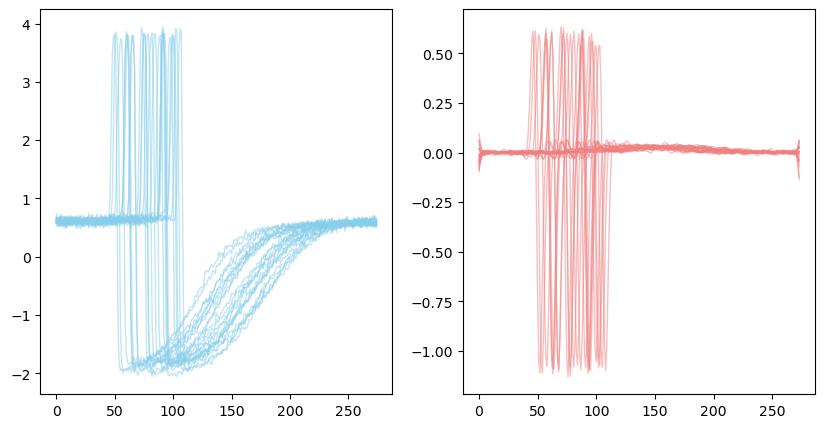

Cluster 2 number of entries 29


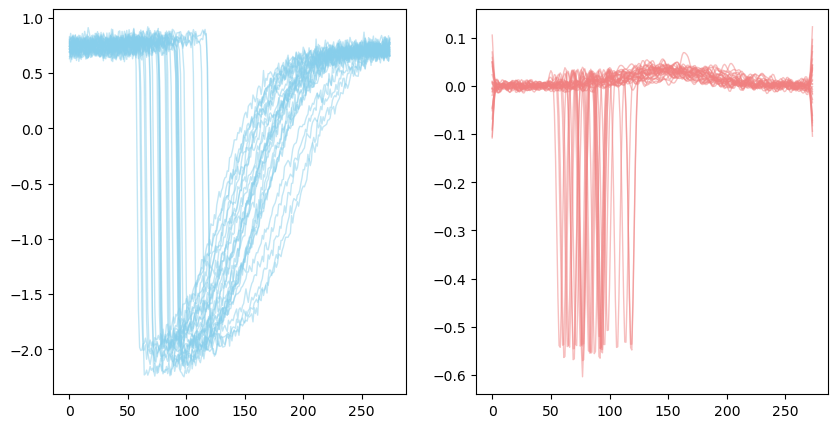

In [59]:
print(f"Determined Optimal Number of Clusters: {determine_optimal_clusters(model, 0.2)}")

print_clusters_with_differenced(X_test, X_differenced, model, determine_optimal_clusters(model, 0.2), plot=True)

#### Iterating through 2 - 6 clusters

Printing clusters for model k=2
V-Measure Score: 0.57
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.326463,19.554264,1.776244,0.572687


Cluster 2 number of entries 76


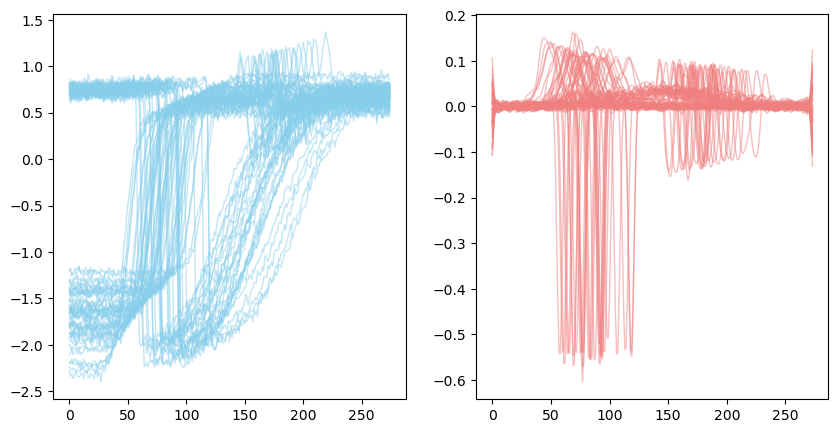

Cluster 1 number of entries 24


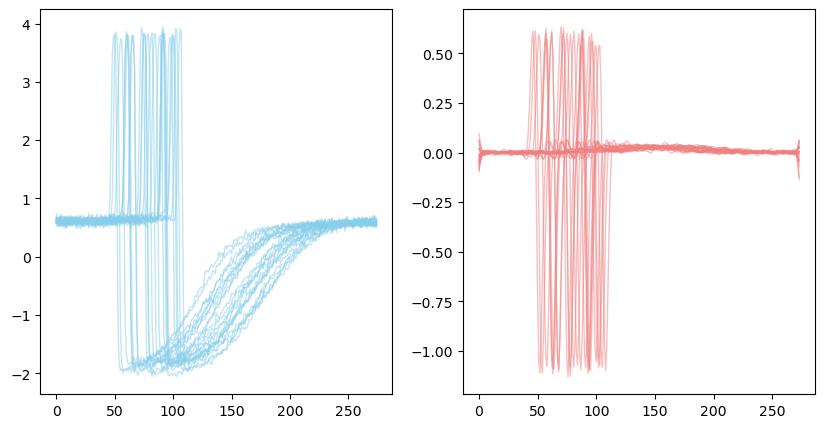

Printing clusters for model k=3
V-Measure Score: 0.87
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=3,0.881894,102.335635,4.953071,0.869493


Cluster 3 number of entries 47


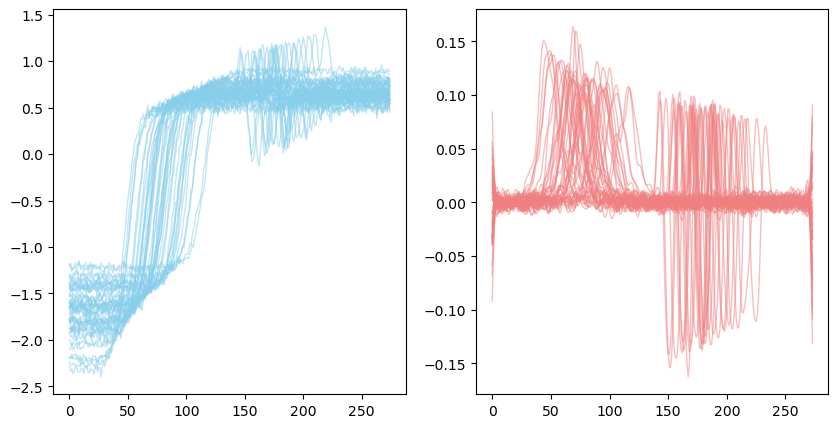

Cluster 1 number of entries 24


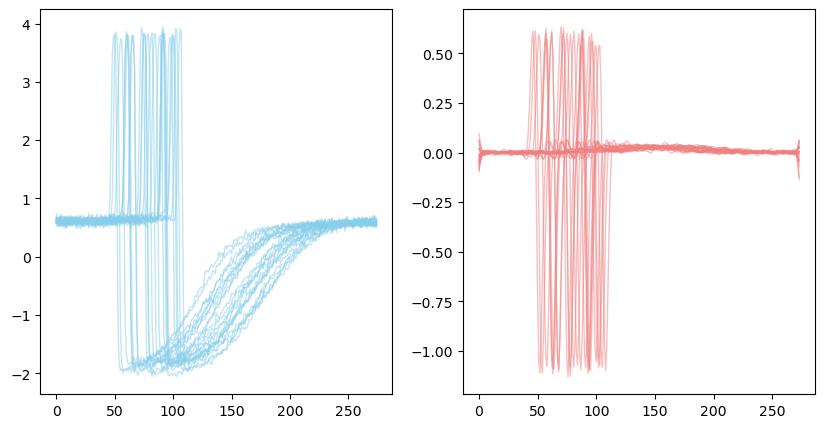

Cluster 2 number of entries 29


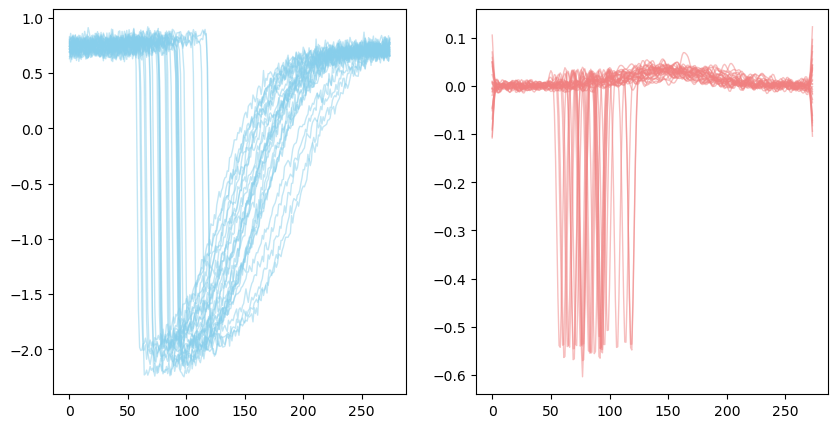

Printing clusters for model k=4
V-Measure Score: 1.0
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=4,0.557864,67.829742,6.983799,1.0


Cluster 4 number of entries 28


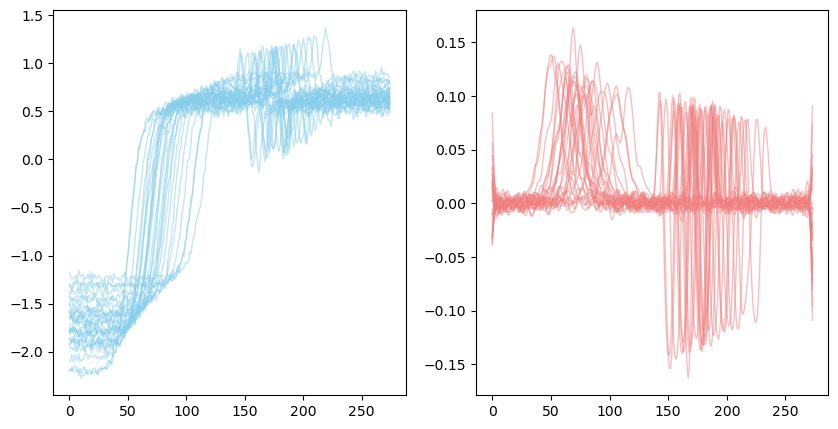

Cluster 3 number of entries 19


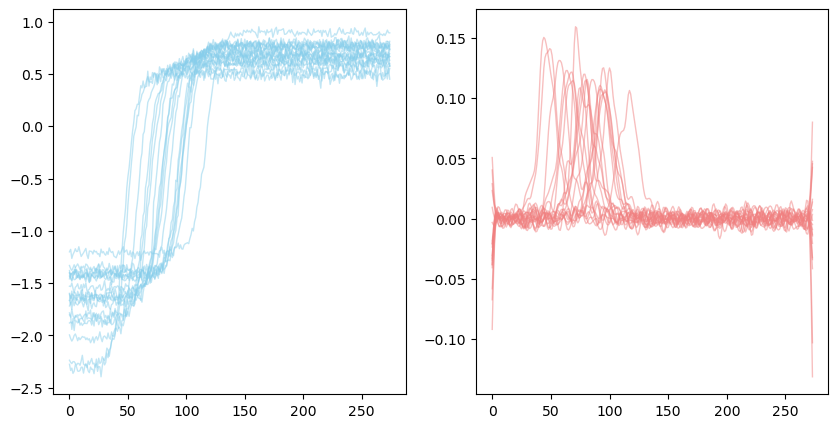

Cluster 1 number of entries 24


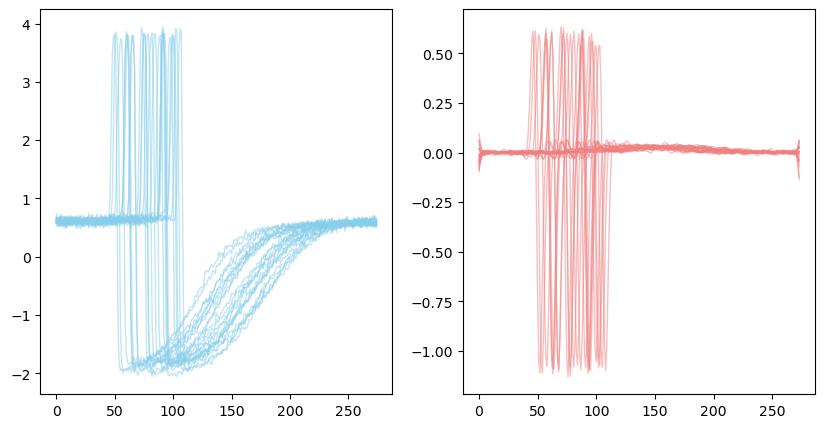

Cluster 2 number of entries 29


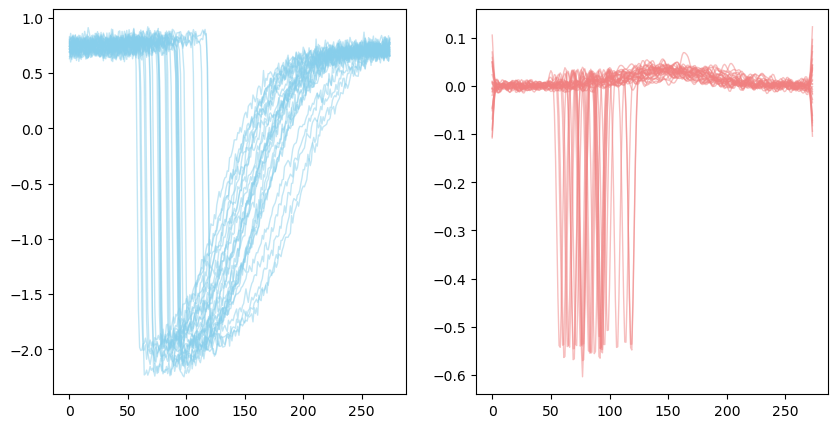

Printing clusters for model k=5
V-Measure Score: 0.97
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=5,0.406055,53.330635,6.244699,0.96813


Cluster 5 number of entries 28


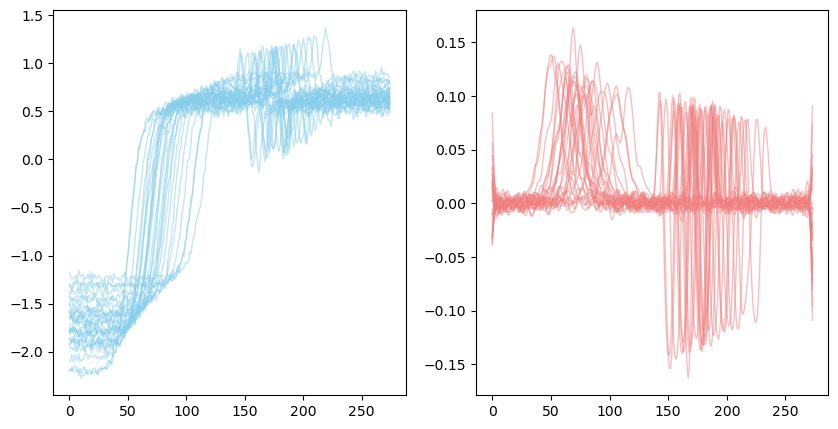

Cluster 4 number of entries 19


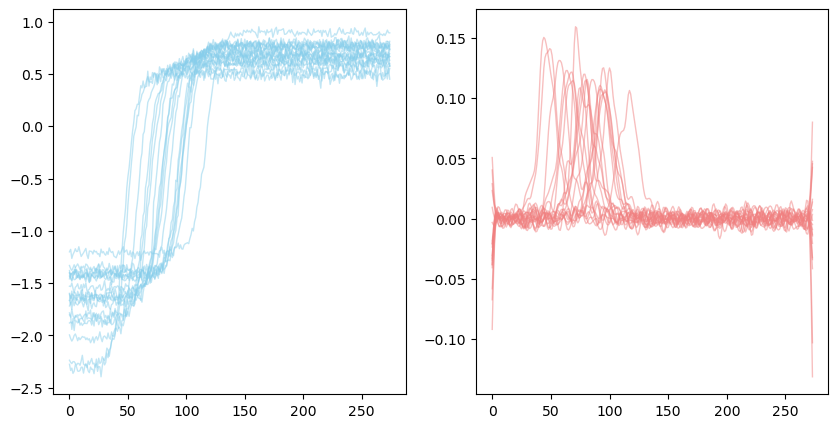

Cluster 2 number of entries 21


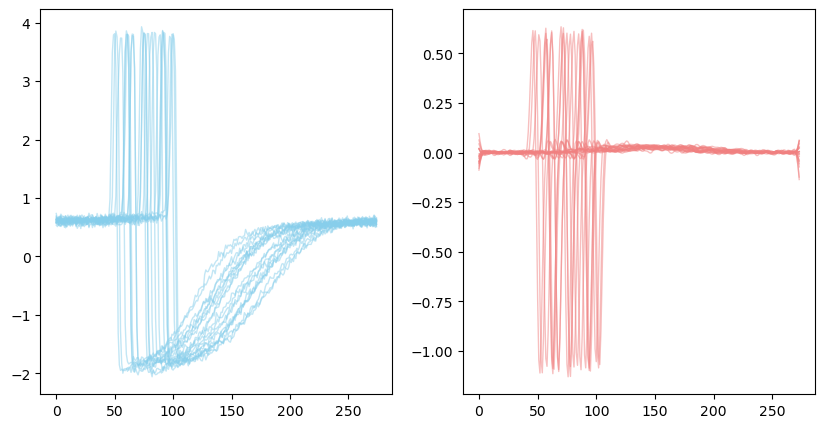

Cluster 3 number of entries 29


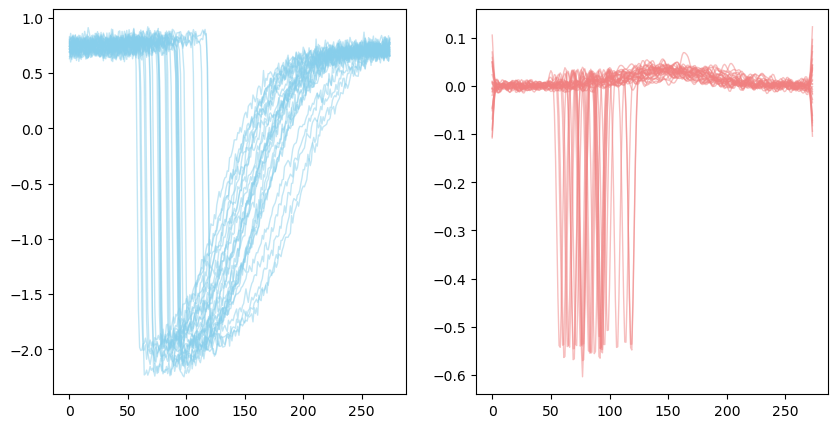

Cluster 1 number of entries 3


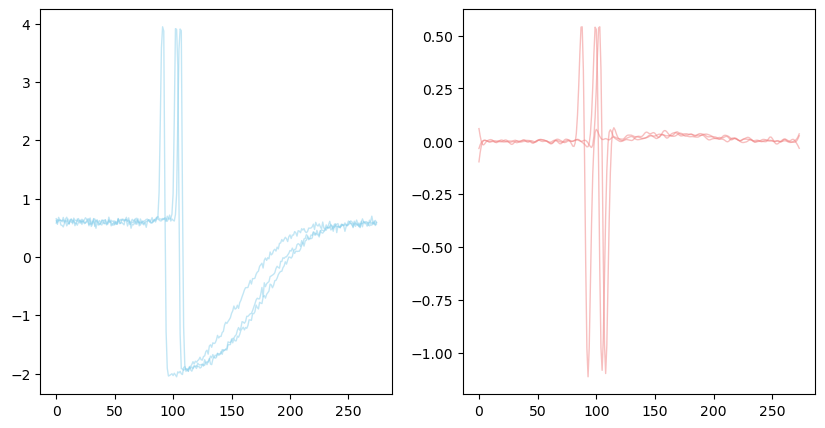

Printing clusters for model k=6
V-Measure Score: 0.95
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=6,0.38582,43.72214,5.269609,0.954604


Cluster 6 number of entries 28


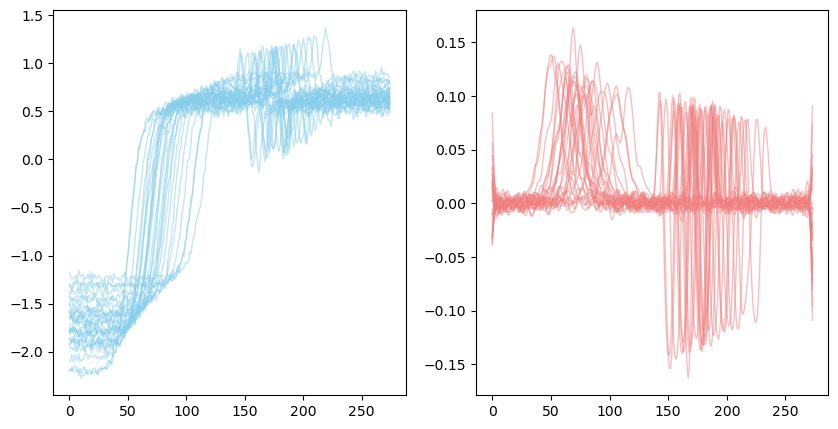

Cluster 5 number of entries 19


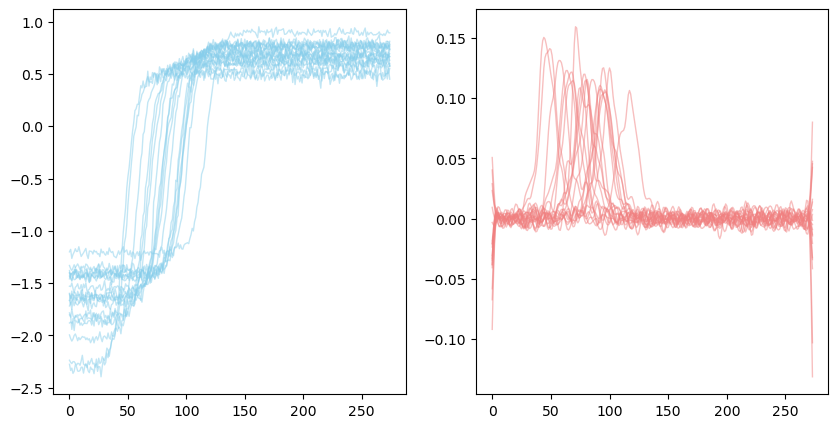

Cluster 2 number of entries 20


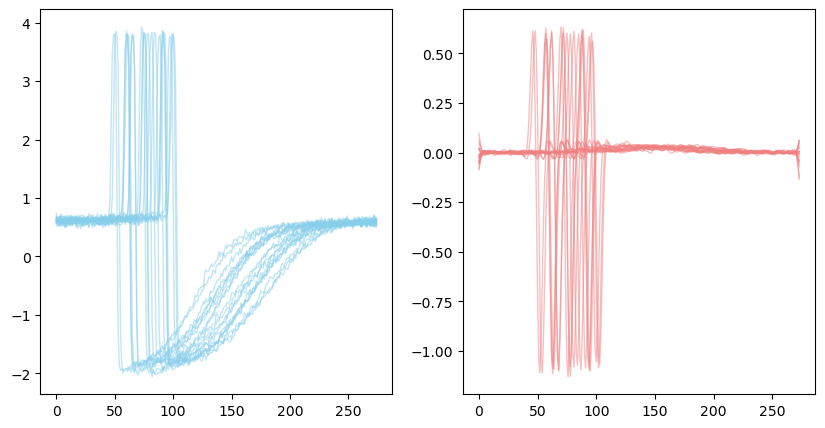

Cluster 4 number of entries 29


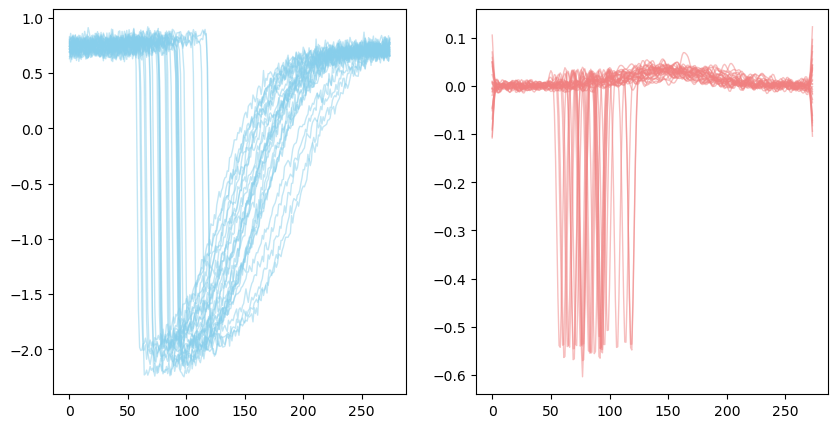

Cluster 1 number of entries 3


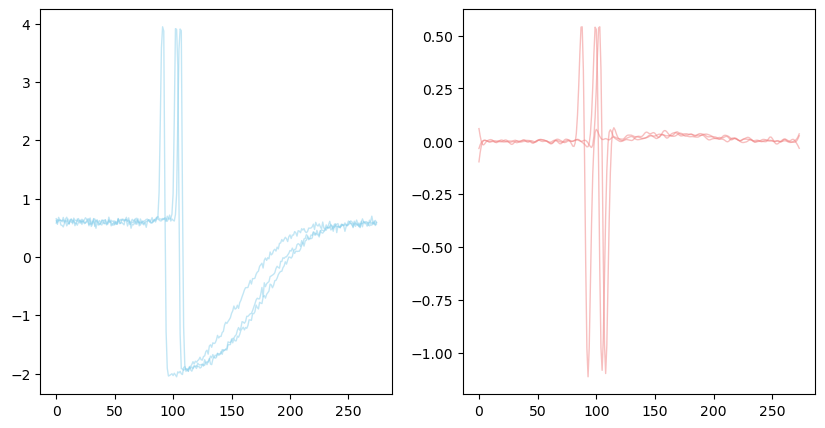

Cluster 3 number of entries 1


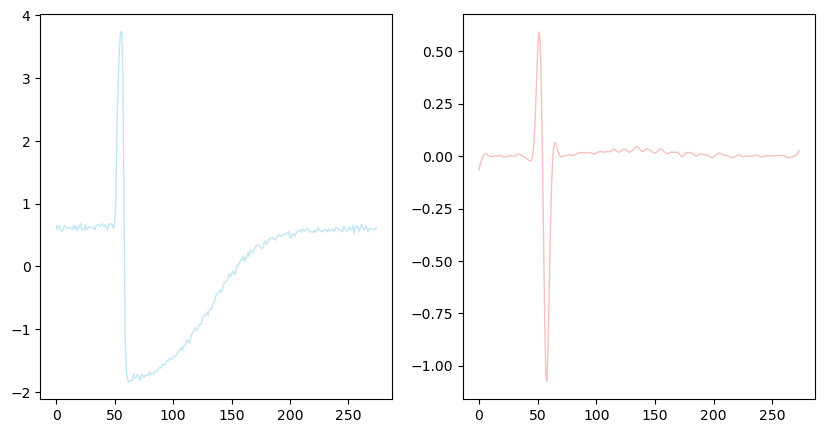

In [60]:
print_clusters_with_differenced(X_test, X_differenced, model, 2, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 3, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 4, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 5, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 6, plot=True)

##### Original Dataset (Ward Linkage)

Distance Matrix Shape: (100, 100)


C:\Users\rhysl\AppData\Local\Temp\ipykernel_33472\3214981558.py:3: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  model = linkage(X, method='ward')


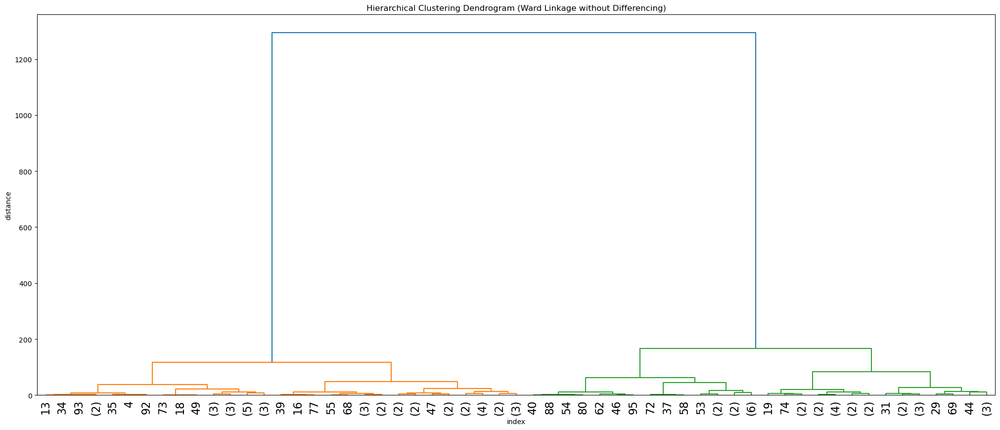

In [55]:
X = format_dataset(X_train, "dtw")

model = linkage(X, method='ward')
# Plot dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram (Ward Linkage without Differencing)')
plt.xlabel('index')
plt.ylabel('distance')
dendrogram(
    model,
    p=5,
    truncate_mode='level',
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=16.,  # font size for the x axis labels
    show_leaf_counts = True
)
plt.show()

#### Optimal number of clusters

Determined Optimal Number of Clusters: 2
Printing clusters for model k=2
V-Measure Score: 0.02
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.001497,1.247858,8.79216,0.016934


Cluster 1 number of entries 53/100


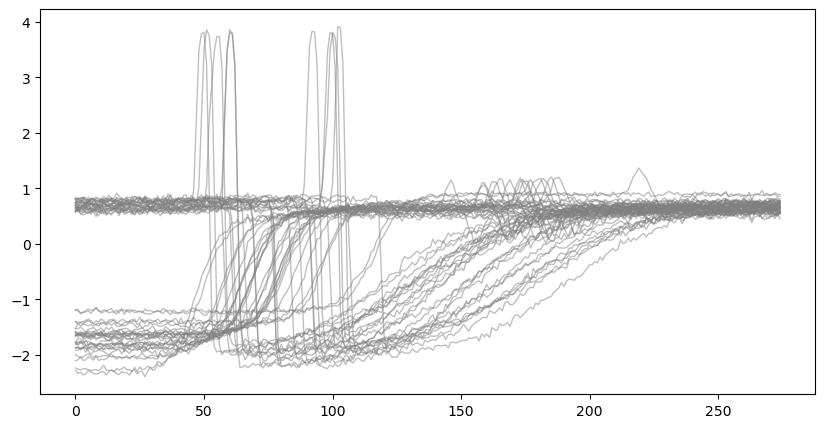

Cluster 2 number of entries 47/100


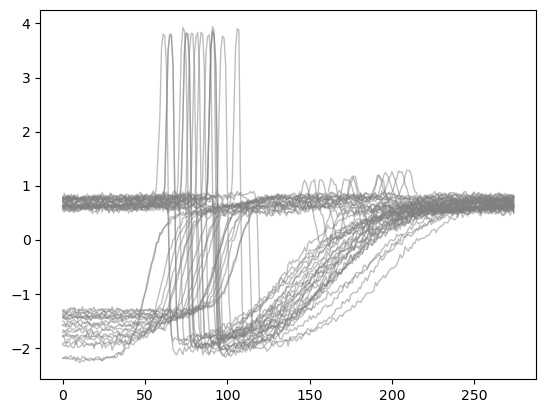

In [56]:
print(f"Determined Optimal Number of Clusters: {determine_optimal_clusters(model, 0.2)}")
print_clusters(X_test, model, determine_optimal_clusters(model, 0.2), plot=True)

#### Iterating through 2 - 6 clusters

Printing clusters for model k=2
V-Measure Score: 0.02
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.001497,1.247858,8.79216,0.016934


Cluster 1 number of entries 53/100


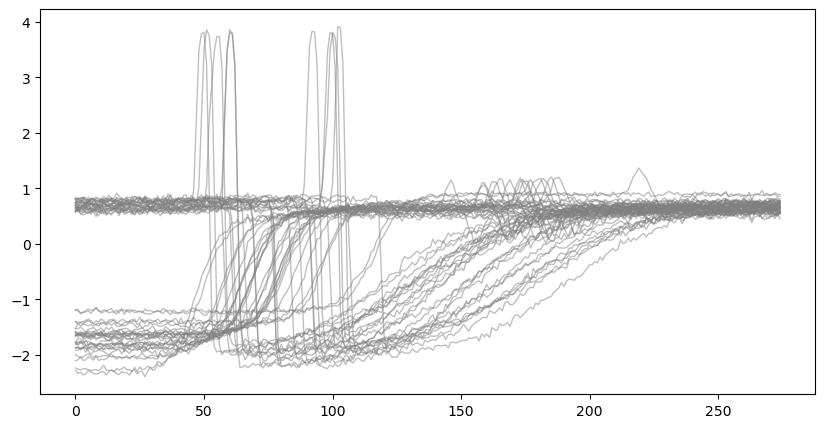

Cluster 2 number of entries 47/100


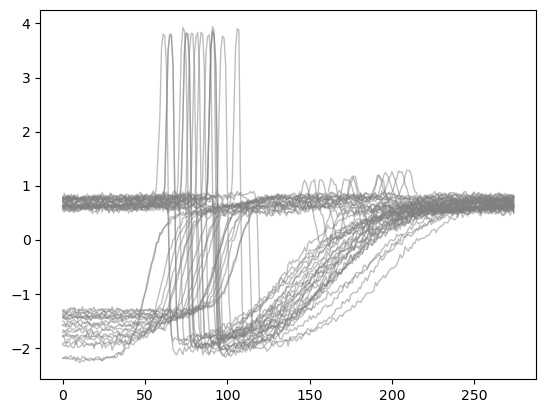

Printing clusters for model k=3
V-Measure Score: 0.05
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=3,-0.057924,0.788225,11.584201,0.04959


Cluster 1 number of entries 53/100


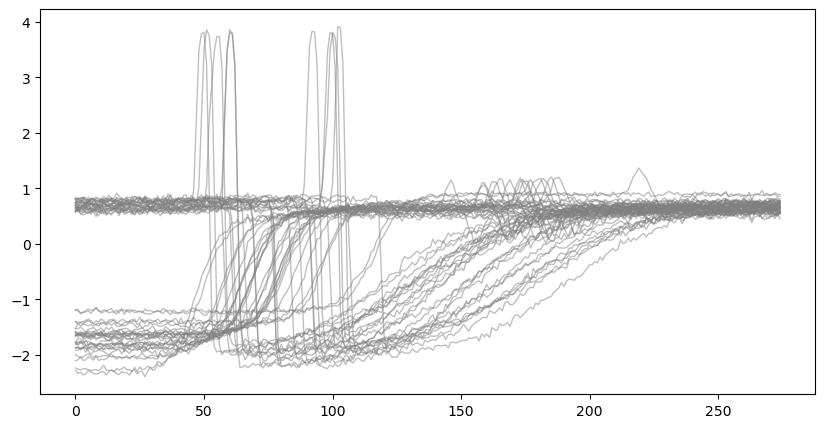

Cluster 2 number of entries 21/100


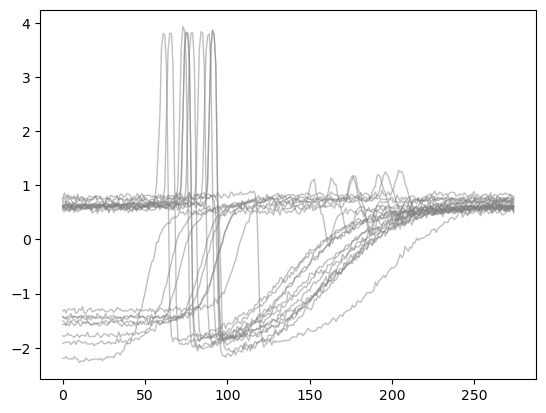

Cluster 3 number of entries 26/100


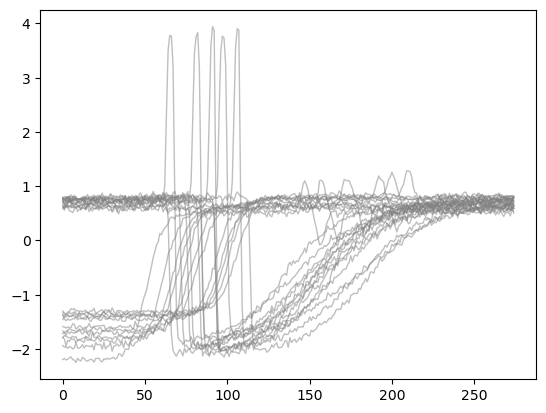

Printing clusters for model k=4
V-Measure Score: 0.08
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=4,-0.091725,0.681776,12.80839,0.078718


Cluster 2 number of entries 28/100


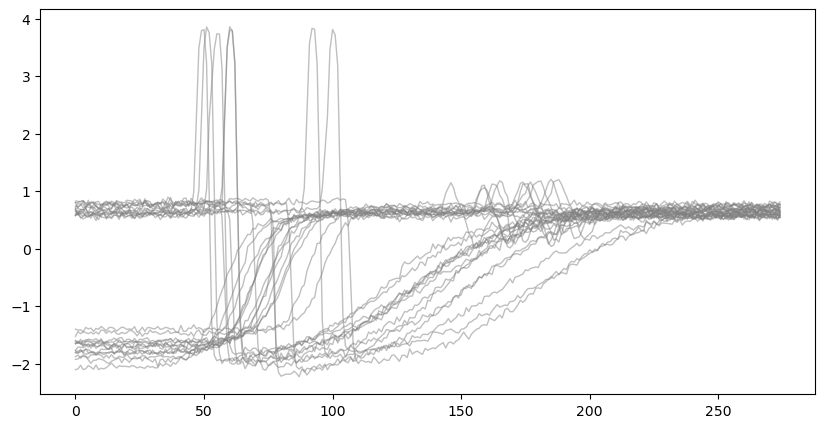

Cluster 1 number of entries 25/100


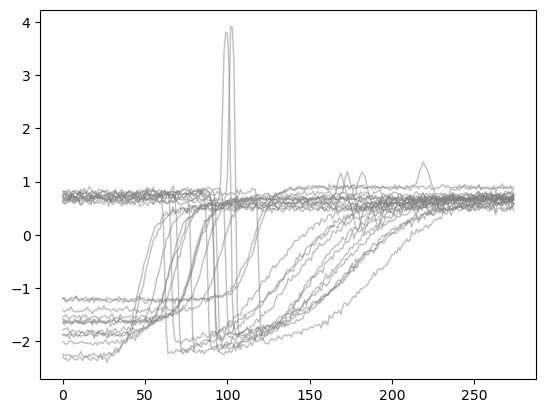

Cluster 3 number of entries 21/100


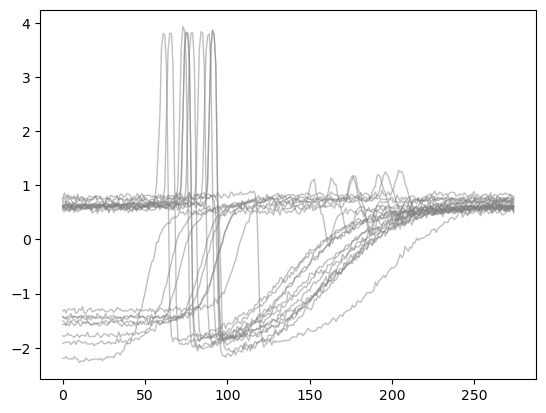

Cluster 4 number of entries 26/100


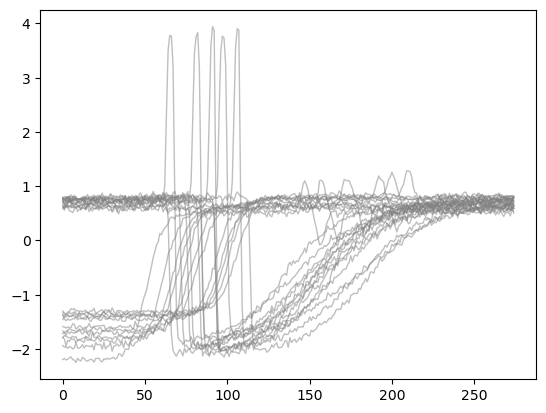

Printing clusters for model k=5
V-Measure Score: 0.08
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=5,-0.175008,0.844277,12.640771,0.079076


Cluster 2 number of entries 28/100


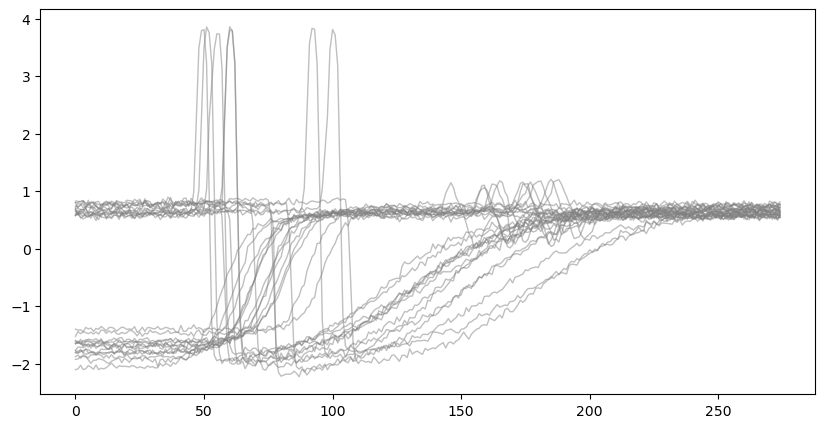

Cluster 1 number of entries 25/100


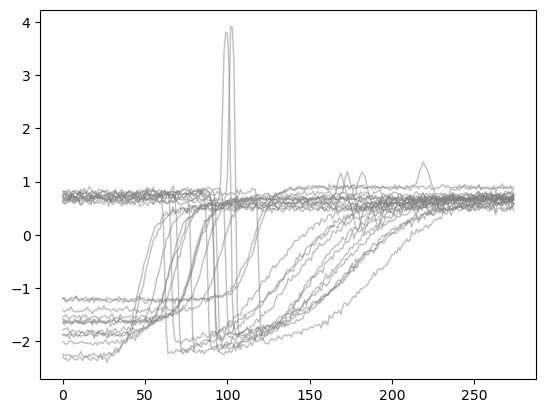

Cluster 3 number of entries 21/100


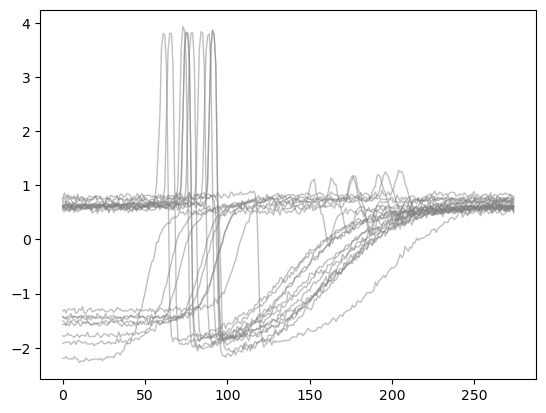

Cluster 4 number of entries 14/100


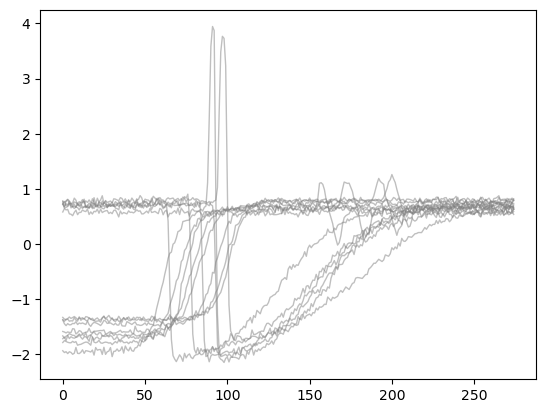

Cluster 5 number of entries 12/100


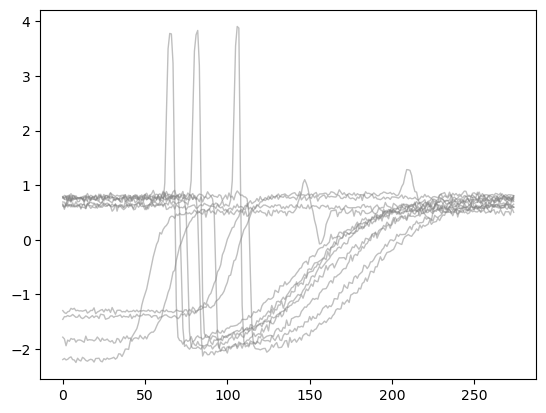

Printing clusters for model k=6
V-Measure Score: 0.09
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=6,-0.189674,0.780662,11.556127,0.086538


Cluster 2 number of entries 28/100


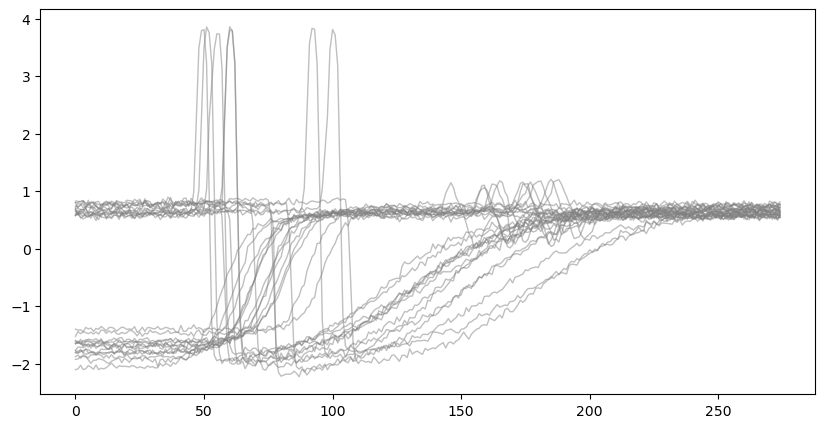

Cluster 1 number of entries 25/100


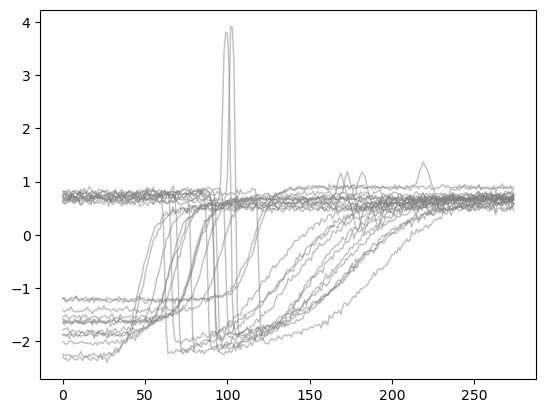

Cluster 4 number of entries 14/100


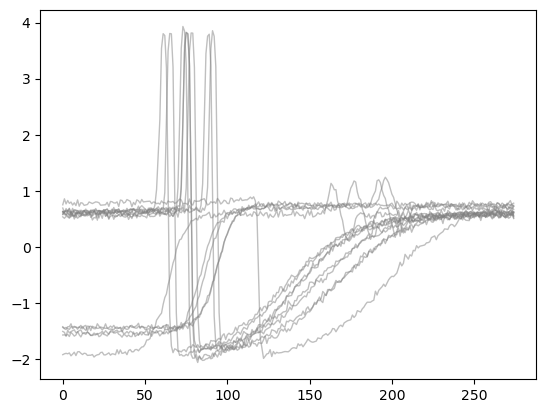

Cluster 5 number of entries 14/100


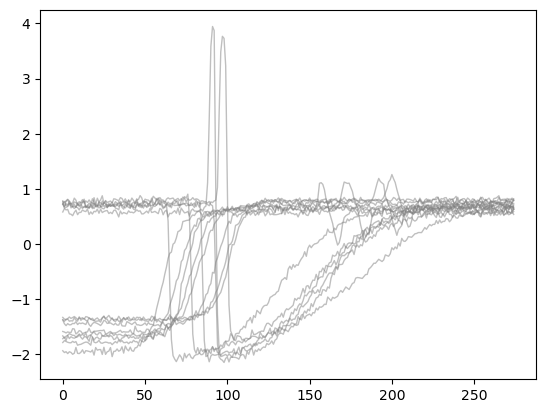

Cluster 6 number of entries 12/100


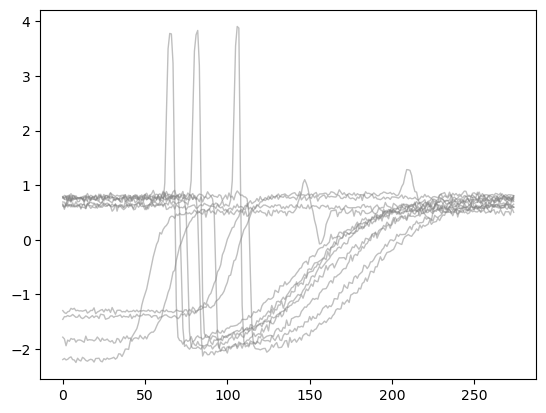

Cluster 3 number of entries 7/100


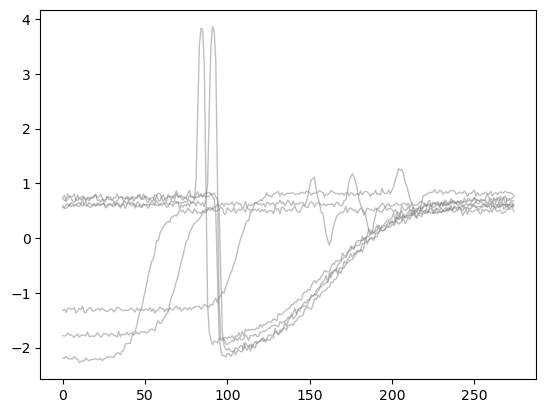

In [57]:
print_clusters(X_test, model, 2, plot=True)
print_clusters(X_test, model, 3, plot=True)
print_clusters(X_test, model, 4, plot=True)
print_clusters(X_test, model, 5, plot=True)
print_clusters(X_test, model, 6, plot=True)

##### Differenced Dataset (Ward Linkage)

Distance Matrix Shape: (100, 100)


C:\Users\rhysl\AppData\Local\Temp\ipykernel_33472\854102379.py:3: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  model = linkage(X, method='ward')


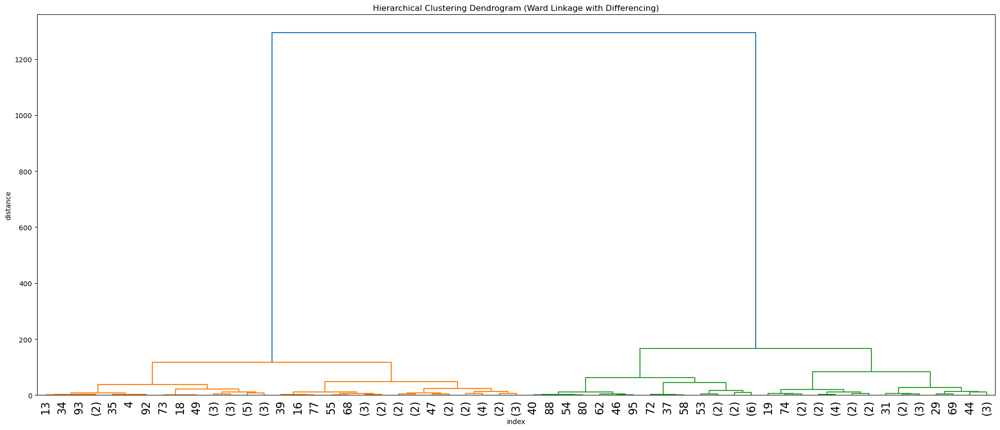

In [52]:
X = format_dataset(X_train, "dtw")

model = linkage(X, method='ward')
# Plot dendogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram (Ward Linkage with Differencing)')
plt.xlabel('index')
plt.ylabel('distance')
dendrogram(
    model,
    p=5,
    truncate_mode='level',
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=16.,  # font size for the x axis labels
    show_leaf_counts = True
)
plt.show()

#### Optimal number of clusters

Determined Optimal Number of Clusters: 2
Printing clusters for model k=2
V-Measure Score: 0.02
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.001497,1.247858,8.79216,0.016934


Cluster 1 number of entries 53


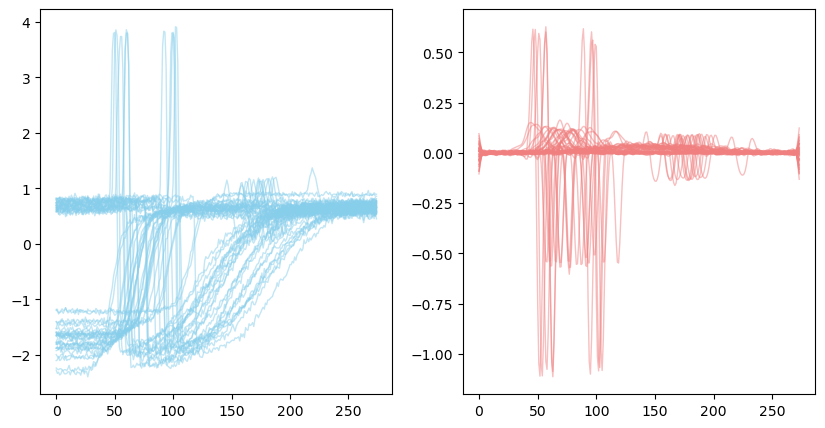

Cluster 2 number of entries 47


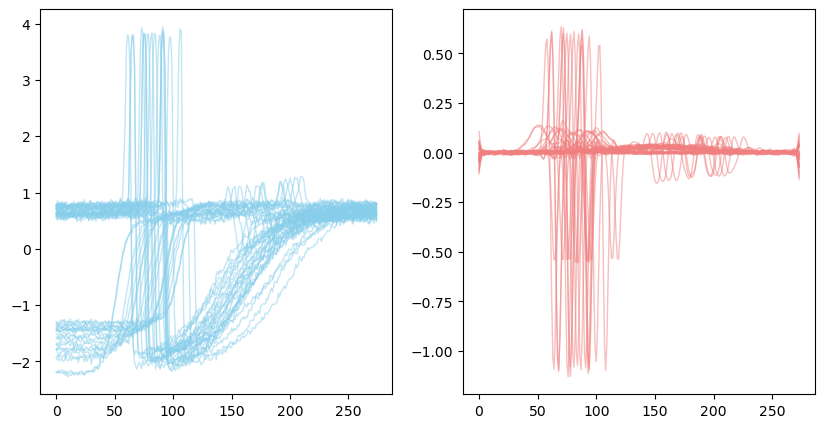

In [54]:
print(f"Determined Optimal Number of Clusters: {determine_optimal_clusters(model, 0.2)}")
print_clusters_with_differenced(X_test, X_differenced, model, determine_optimal_clusters(model, 0.2), plot=True)

#### Iterating through 2 - 6 clusters

Determined Optimal Number of Clusters: 2
Printing clusters for model k=2
V-Measure Score: 0.02
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=2,0.001497,1.247858,8.79216,0.016934


Cluster 1 number of entries 53


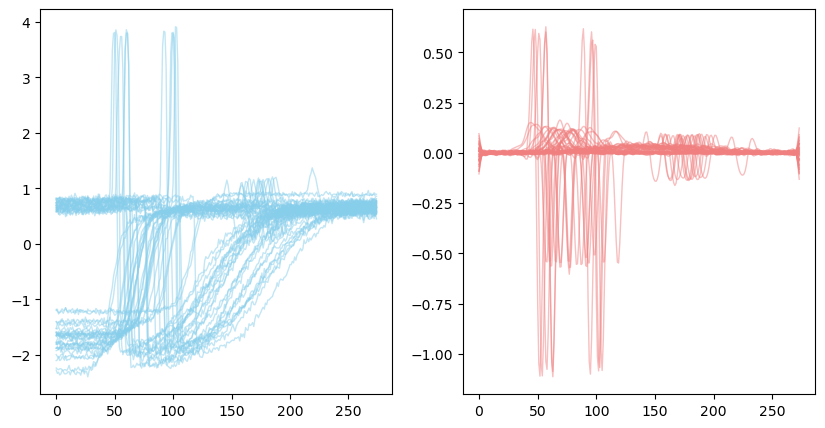

Cluster 2 number of entries 47


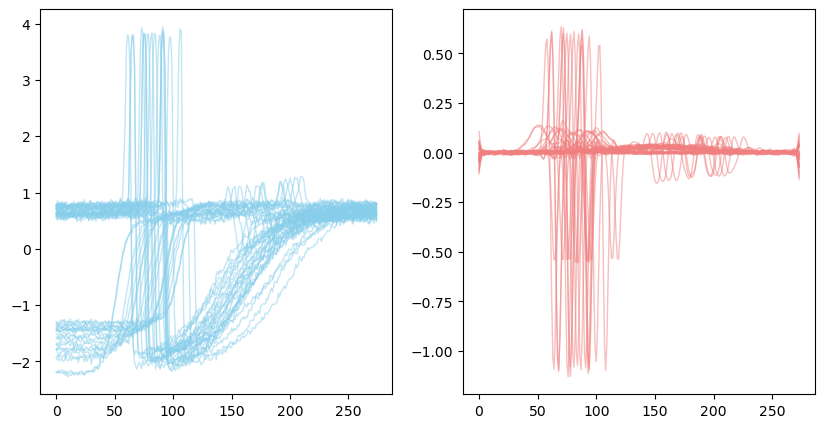

Printing clusters for model k=3
V-Measure Score: 0.05
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=3,-0.057924,0.788225,11.584201,0.04959


Cluster 1 number of entries 53


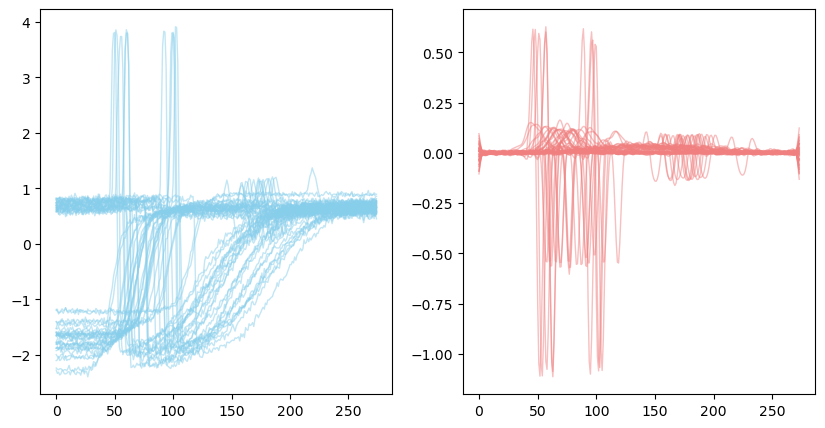

Cluster 2 number of entries 21


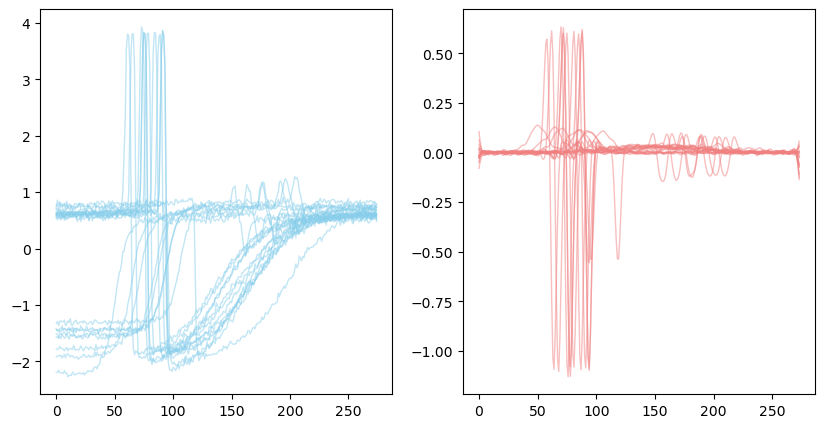

Cluster 3 number of entries 26


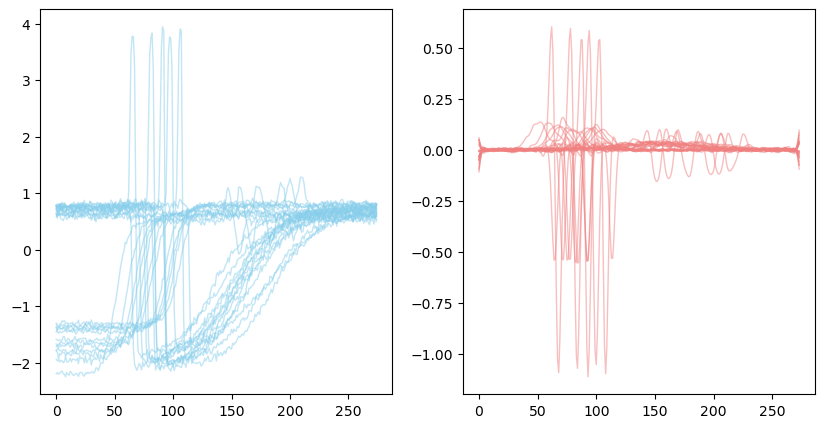

Printing clusters for model k=4
V-Measure Score: 0.08
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=4,-0.091725,0.681776,12.80839,0.078718


Cluster 2 number of entries 28


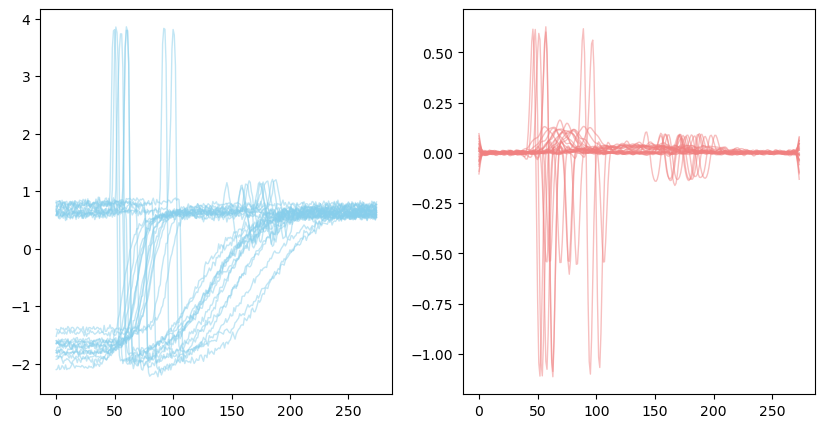

Cluster 1 number of entries 25


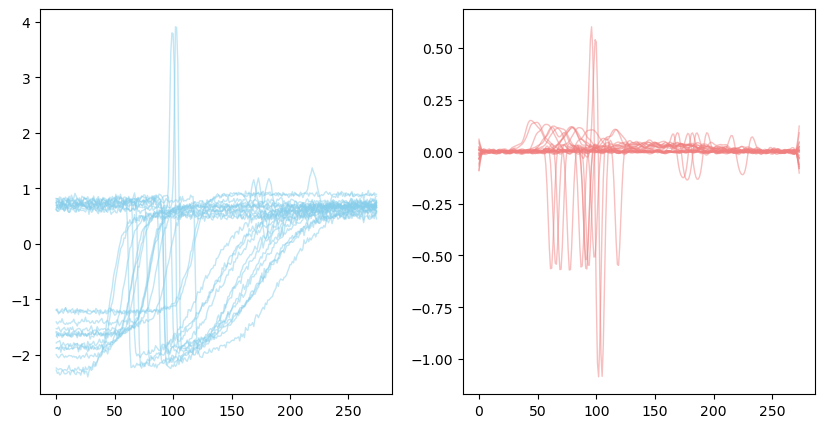

Cluster 3 number of entries 21


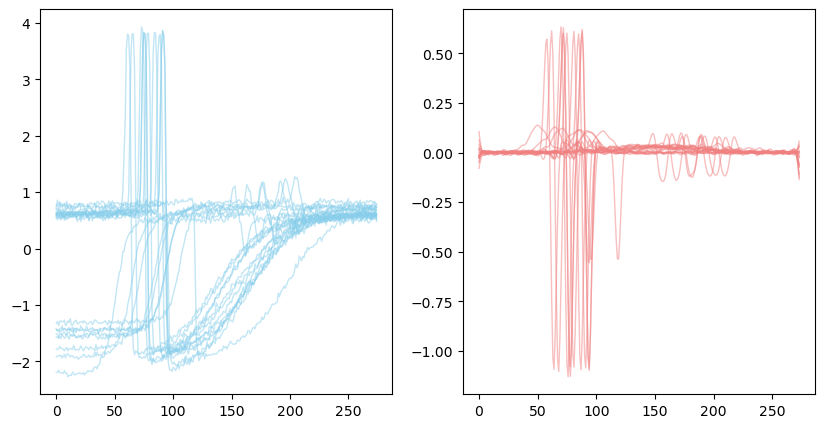

Cluster 4 number of entries 26


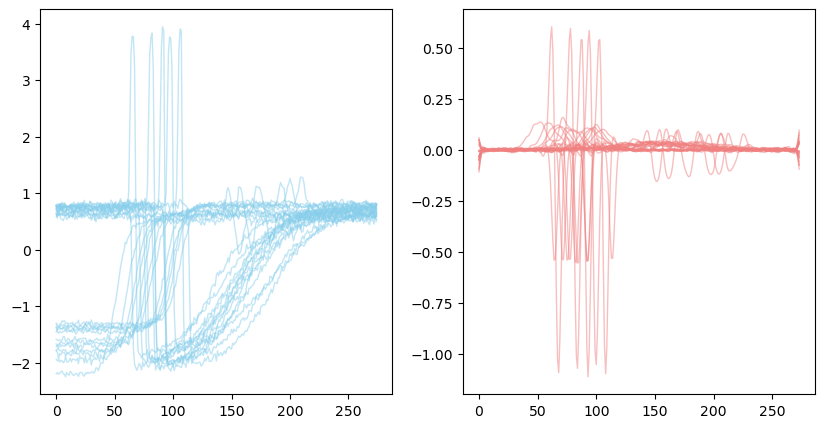

Printing clusters for model k=5
V-Measure Score: 0.08
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=5,-0.175008,0.844277,12.640771,0.079076


Cluster 2 number of entries 28


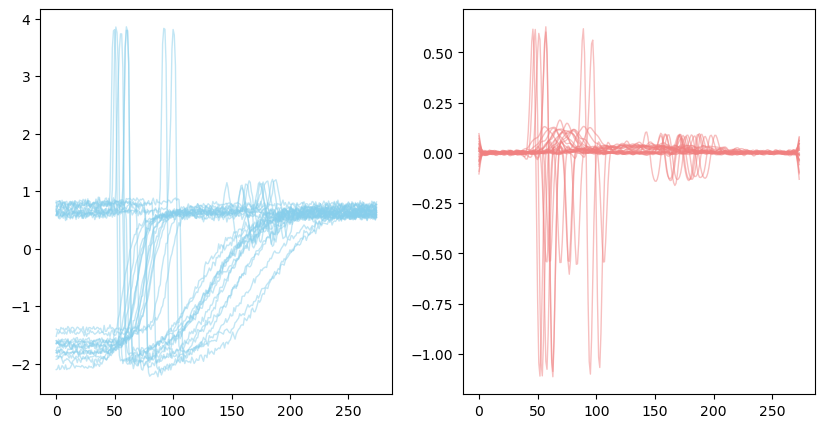

Cluster 1 number of entries 25


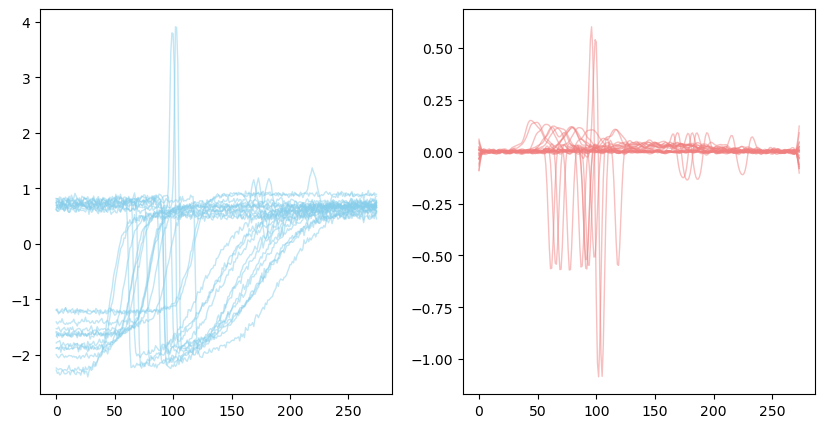

Cluster 3 number of entries 21


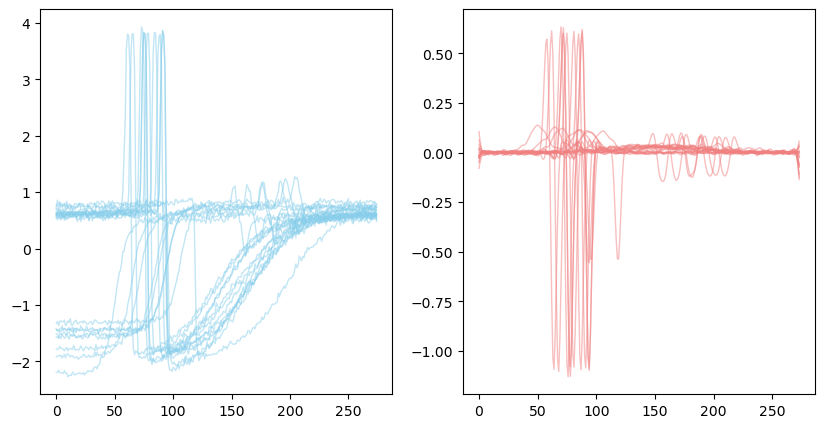

Cluster 4 number of entries 14


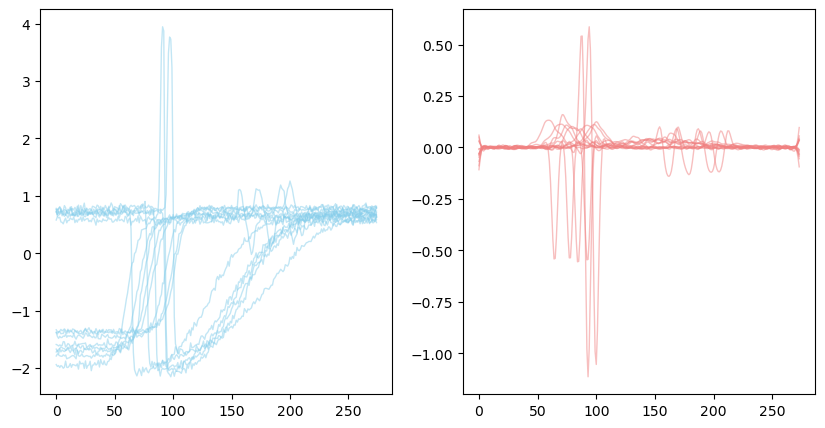

Cluster 5 number of entries 12


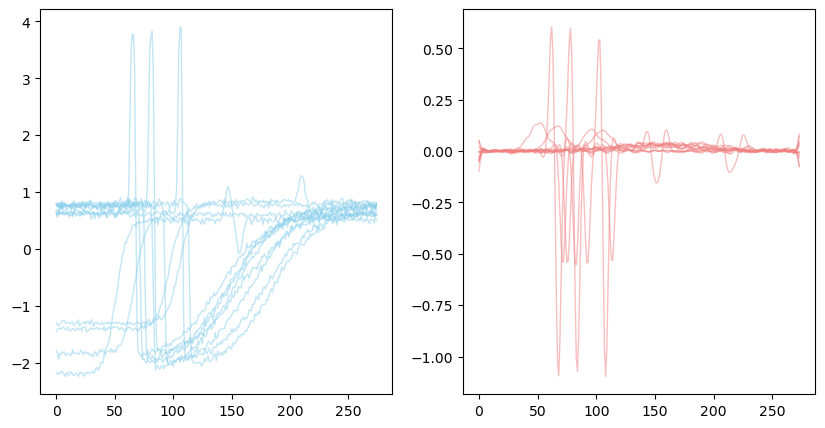

Printing clusters for model k=6
V-Measure Score: 0.09
Testing Results


,silhouette,calinski_harabasz,davies_bouldin,v_measure_score
k=6,-0.189674,0.780662,11.556127,0.086538


Cluster 2 number of entries 28


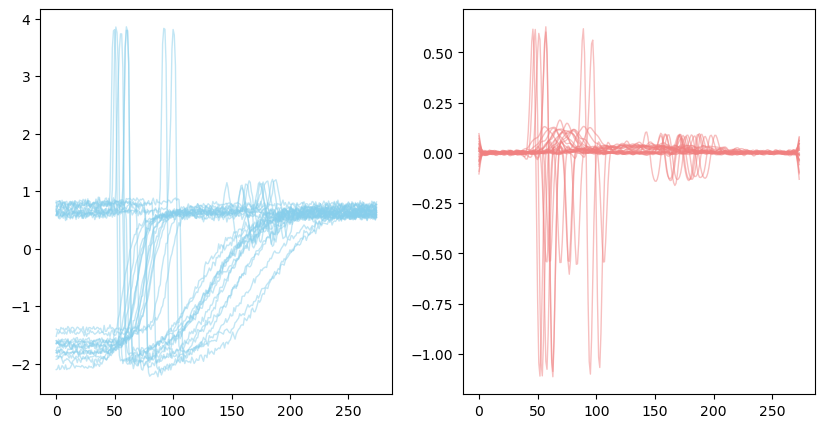

Cluster 1 number of entries 25


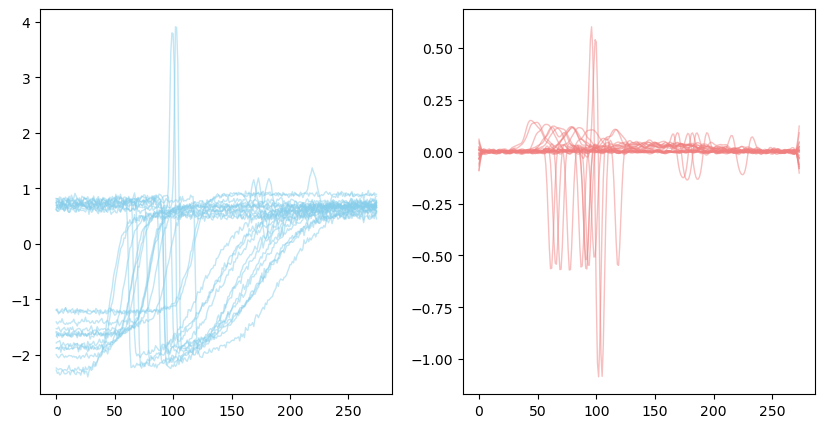

Cluster 4 number of entries 14


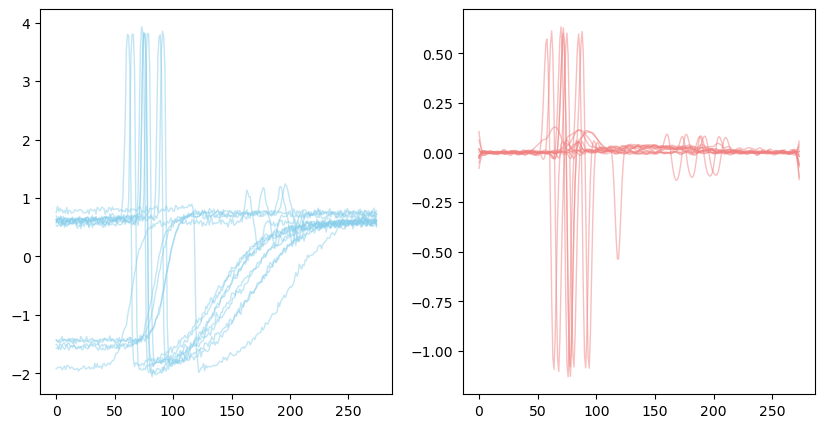

Cluster 5 number of entries 14


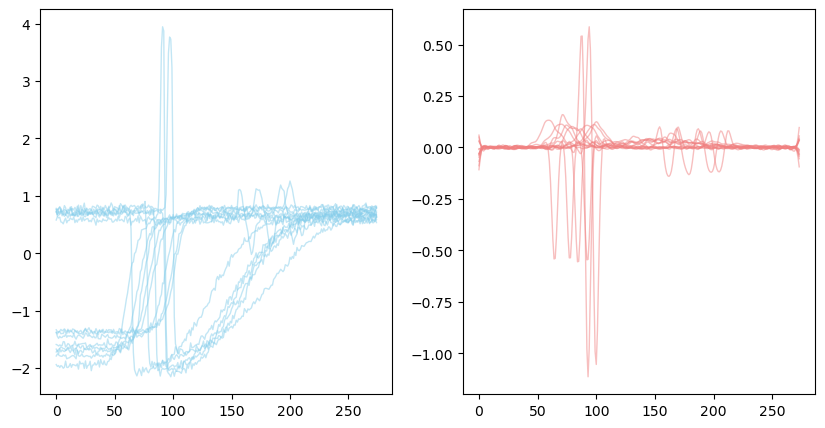

Cluster 6 number of entries 12


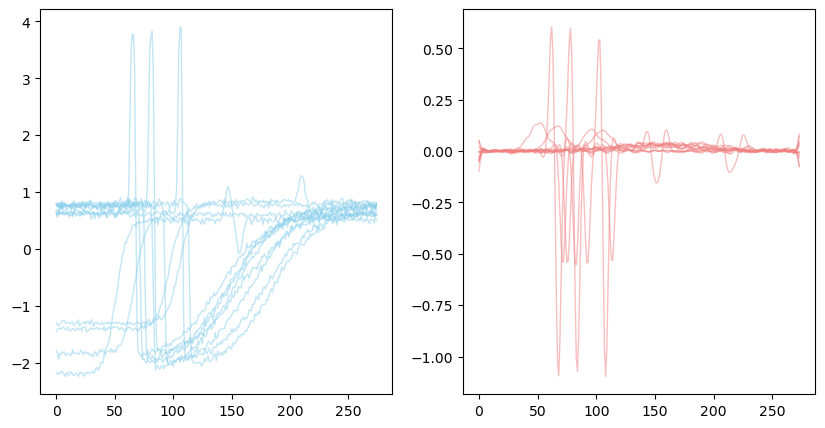

Cluster 3 number of entries 7


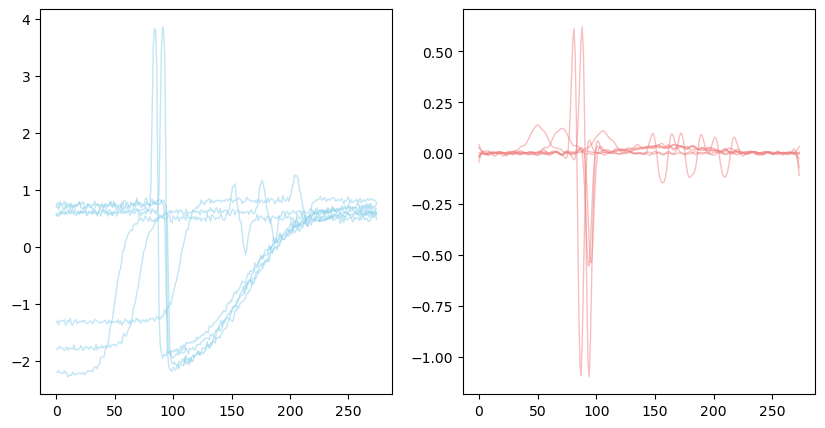

In [53]:
print_clusters_with_differenced(X_test, X_differenced, model, 2, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 3, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 4, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 5, plot=True)
print_clusters_with_differenced(X_test, X_differenced, model, 6, plot=True)